In [1]:
## First import general packages for running python analysis:
import os, h5py, datetime,pytz,pickle, yaml
import numpy as np
from matplotlib.pyplot import *
from matplotlib import pyplot as plt
import scipy.optimize as opt
from scipy.optimize import curve_fit
from scipy.optimize import leastsq
from scipy.optimize import least_squares

## Then import the beamcals module packages and initialize 'gbosite' class:
from beamcals import corr, concat, drone, bicolog
import beamcals.plotting_utils as pu
import beamcals.fitting_utils as fu
import beamcals.geometry_utils as gu
import beamcals.time_utils as tu
from beamcals.sites import site
import beamcals.reduce_ccclass as rc
gbosite=site.site('../beamcals/beamcals/sites/GBO_config.npz')

#Epols = [0,3,4,7,9,10,12,14]
#Npols = [1,2,5,6,8,11,13,15]

Epols = [0,2,4,6,8,10,12,14]
Npols = [1,3,5,7,9,11,13,15]
config_directory="/hirax/GBO_Analysis_Outputs/concat_config_files/"

# dishes are 2n, 2n+1 pairs

freqs = 800.0*np.ones(1024) + (-400/1024.)*np.arange(1024)

# Read in data and find the time offset, and five rotation locations

20211020T215911Z /hirax/GBO_Oct_2021/TONE_ACQ/20211020T215858Z_yale_drone/corr/20211020T215911Z/ /hirax/GBO_Oct_2021/TONE_ACQ/digital_gains/20211020T215858Z_yale_drone_yale_digitalgain/
Initializing drone data via datcon_csv routine: FLY608.csv
  --> Skipping rows 1 to 499 to eliminate NAN values
  --> Attempting to load position data from RTK
    --> RTK Data not found for this data file...
  --> Loading position data from GPS(0) instead:
Timestamp interpolation succeeded
  --> generating llh, geocentric cartesian, local cartesian, and local spherical coordinates.
  --> generating dish and receiver line of sight coordinates.
DONE reading in drone data
2021-10-20 22:01:03.800000+00:00 2021-10-20 22:12:56.996000+00:00


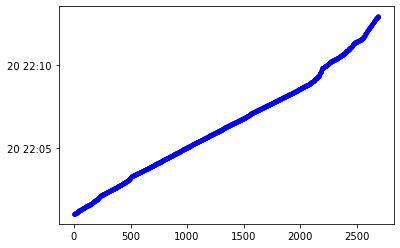

plotting drone coordinates for all time samples:
overplotting drone coordinates for t_cut samples: [0:-1]
start time:  2024-08-14 10:28:12.430502
Initializing Correlator Class using:
  --> /hirax/GBO_Oct_2021/TONE_ACQ/20211020T215858Z_yale_drone/corr/20211020T215911Z/
  --> Arrays initialized with shape (60, 256, 1024, 16)
Assigning array values by reading in data files:
  --> Loading File: 0059/0059
  --> Finished. Reshaping arrays.
end time:  2024-08-14 10:30:52.822382


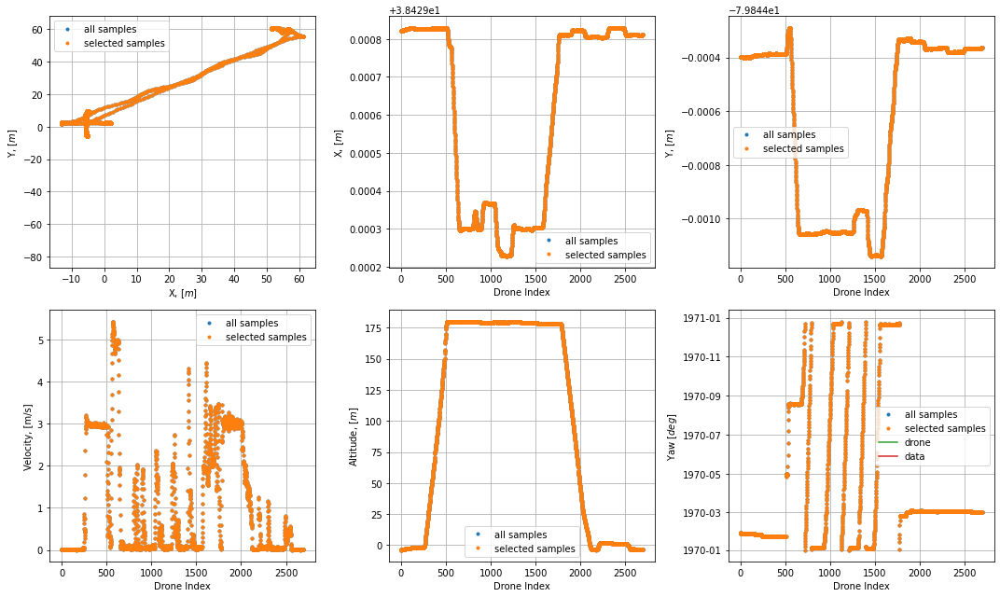

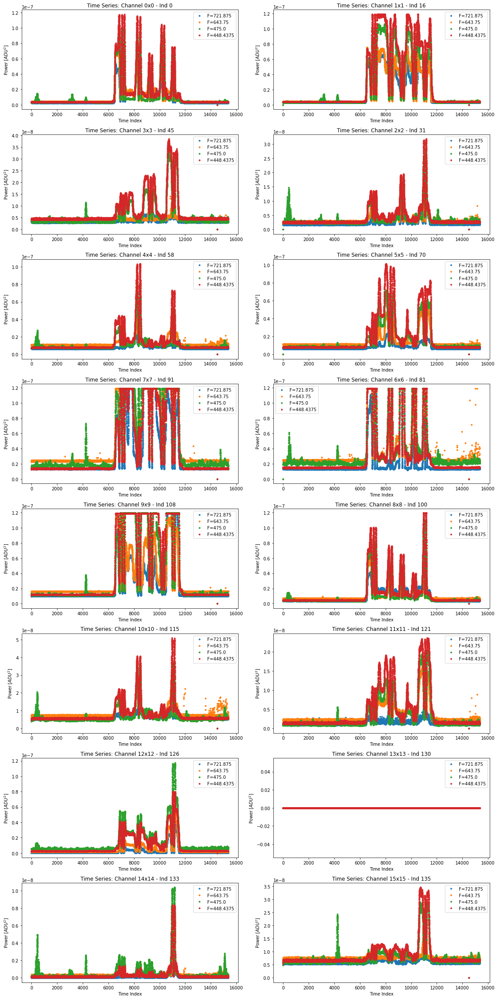

In [2]:
# Read the yaml for the flight you're interested in:
fly = '608'
cdat = '20211020T215858Z'

if int(fly) < 537:
    mdir='/hirax/GBO_Aug_2021/TONE_ACQ/'+cdat+'_yale_drone/corr/' # August 2021
    gaindir='/hirax/GBO_Aug_2021/TONE_ACQ/digital_gains/'+cdat+'_yale_drone_yale_digitalgain/' # August 2021
else:
    mdir='/hirax/GBO_Oct_2021/TONE_ACQ/'+cdat+'_yale_drone/corr/' # Oct 2021
    gaindir='/hirax/GBO_Oct_2021/TONE_ACQ/digital_gains/'+cdat+'_yale_drone_yale_digitalgain/' # Oct 2021

sdir = os.listdir(mdir)[0]
datadir=mdir+sdir+'/'
print(sdir, datadir,gaindir)
    
dronedir='/hirax/all_drone_data/datcon_csv/'
dronetest0825=drone.Drone_Data(Drone_Directory=dronedir,FLYTAG='FLY'+fly+'.csv',site_class=gbosite,tlb=0,tub=-1)

print('DONE reading in drone data')
print(dronetest0825.t_arr_datetime[0], dronetest0825.t_arr_datetime[-1])


plt.plot(dronetest0825.t_arr_datetime,'b.',label='drone')
plt.show()

pu.Plot_Drone_Coordinates(dronetest0825,coo='xy')#,t_bounds=[tlb,tub])
#pu.Plot_Drone_Coordinates(dronetest0825,coo='xy',t_bounds=[tlb,tub])


## Combine drone and correlator data
print('start time: ', datetime.datetime.now())
corrtest0825=corr.Corr_Data(Data_Directory=datadir,
                            Gain_Directory=gaindir,site_class=gbosite,
                            crossmap=[])
#

    
print('end time: ', datetime.datetime.now())

# putting checks in one cell now that I know I've mostly figured out the flight/corr file correspondence
# This checks I copied and pasted ok :)

## plot their datetime arrays to check overlap:

plot(dronetest0825.t_arr_datetime,label='drone')
plot(corrtest0825.t_arr_datetime,label='data')
legend()


config_directory="/hirax/GBO_Analysis_Outputs/concat_config_files/"

concattest=concat.CONCAT(CORRDATCLASS=corrtest0825,DRONEDATCLASS=dronetest0825,\
                             load_yaml=False,traceback=False,save_traceback=False)
#concattest0825=concat.CONCAT(CORRDATCLASS=corrtest0825,DRONEDATCLASS=dronetest0825,load_yaml=True,
#                             traceback=False,save_traceback=False)

pu.Plot_Time_Series(concattest,freqlist=[200,400,832,900]) # previously set to just 700

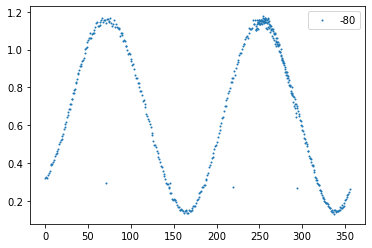

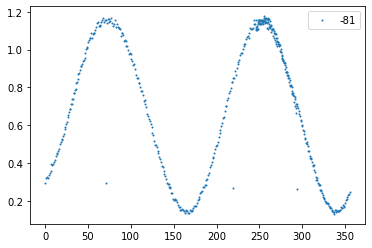

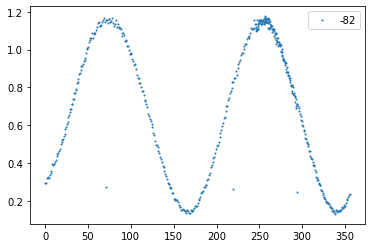

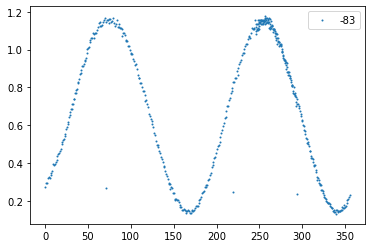

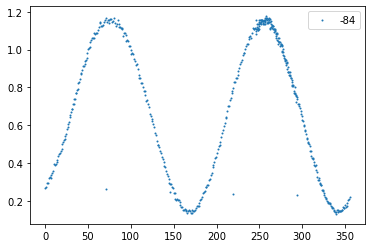

...

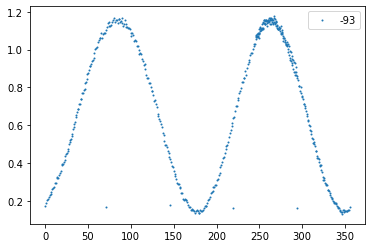

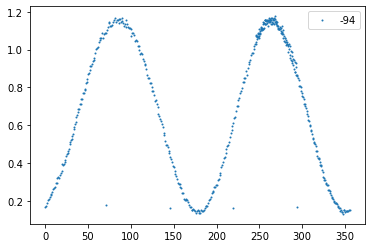

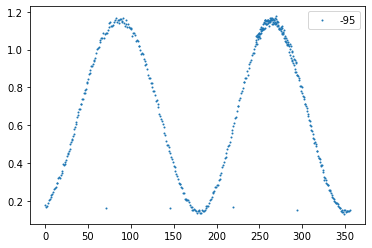

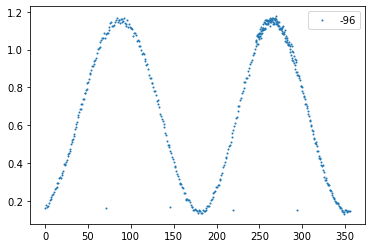

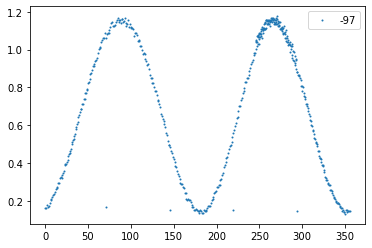

88 samples of 42ms cadence data:  3.696


In [3]:
# Through various machinations, we have these indices for the rotation components:

ccm = cm.magma # use magma for color maps
colorz=pu.cm_to_discrete(ccm,5)

# First, note that the drone and telescope time stamps are not aligned. We change by eye, by
# moving the drone stime stamps back by nn samples:


# Plot telescope signal as a funciton of yaw

freq = 900
k = 0
pol = 0
for nn in np.arange(-80,-98,-1):
    pos0 = np.arange(6900+nn, 7370+nn)
    pos1 = np.arange(8140+nn,8650+nn)
    pos2 = np.arange(9150+nn,9550+nn)
    pos3 = np.arange(10060+nn,10500+nn)
    pos4 = np.arange(10950+nn,11300+nn)
    poss = [pos0,pos1,pos2,pos3,pos4]
    
    shiftedyaw = np.roll(concattest.drone_yaw_interp,nn)

    plt.plot(shiftedyaw[poss[k]], 
                1e7*(concattest.V[poss[k],freq,pol]), '.', markersize = 2,label=str(nn))
            
    plt.legend()
    plt.show()

print('88 samples of 42ms cadence data: ',88*42E-3)

# 88 and 89 look pretty similar, and mildly better than the other ones. Choose 88 ()


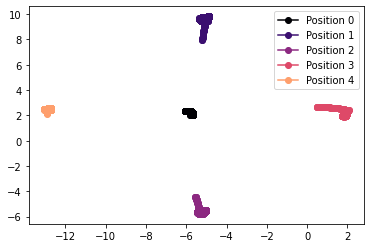

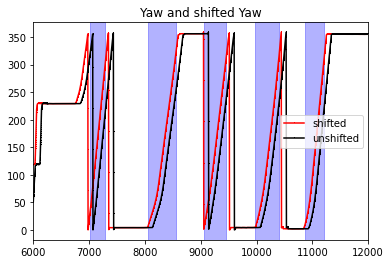

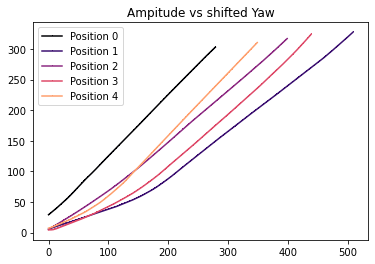

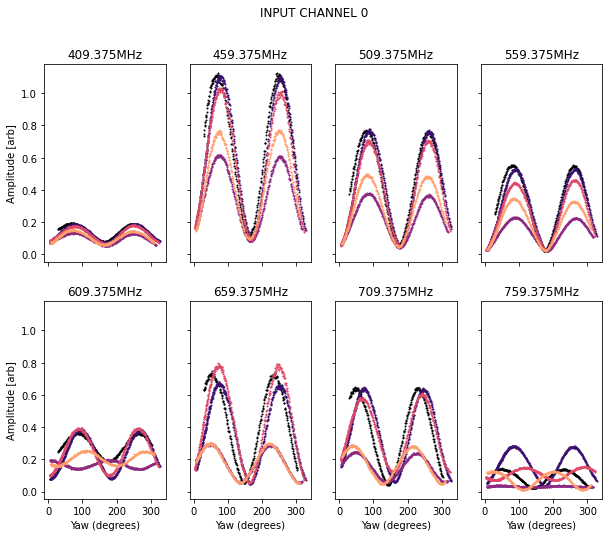

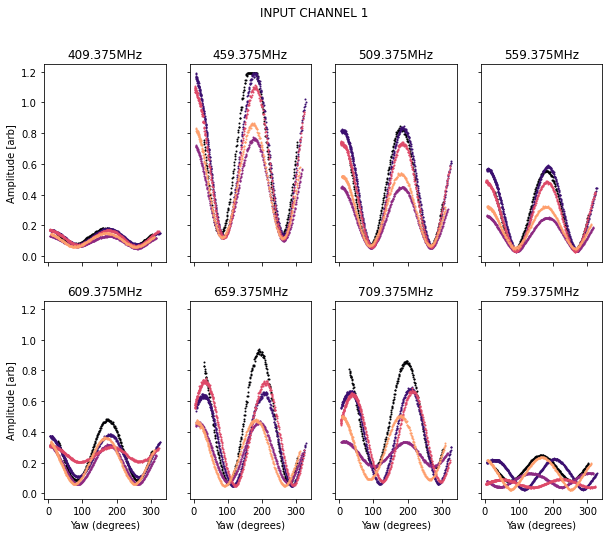

...

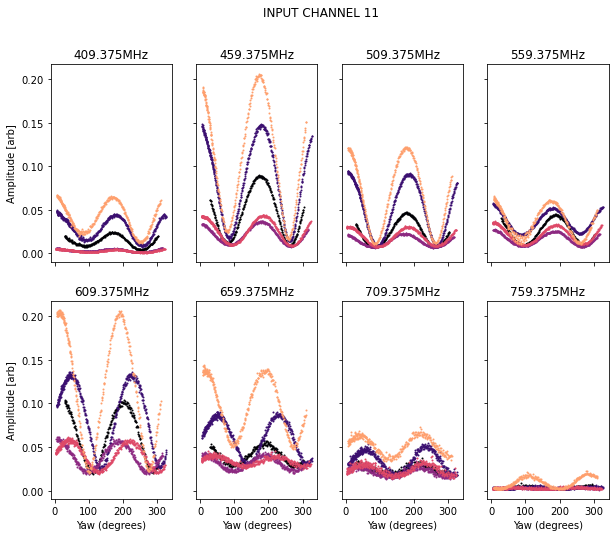

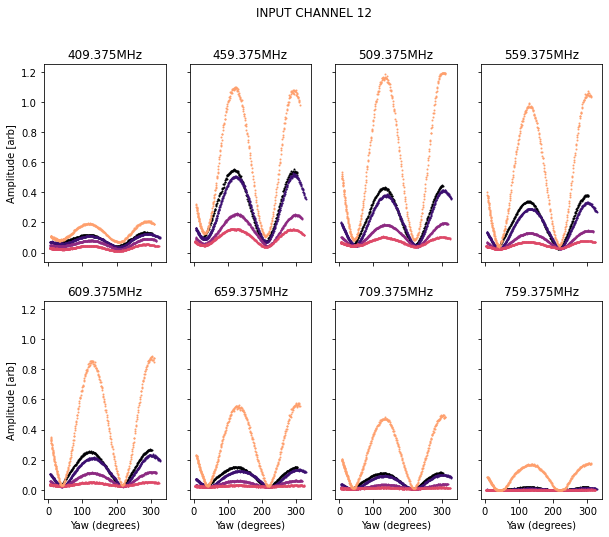

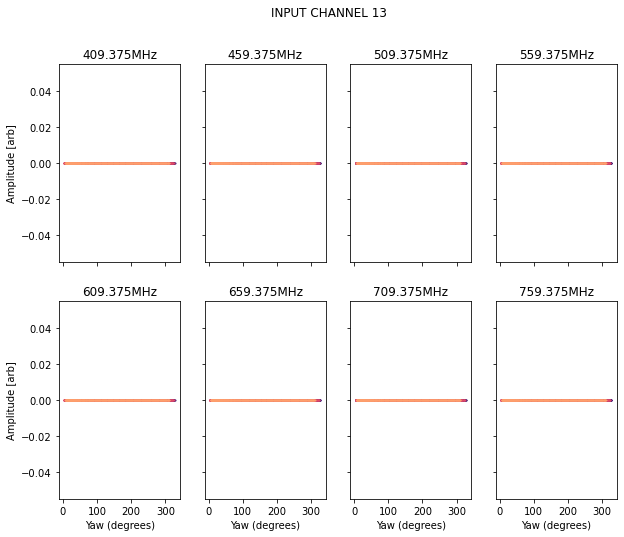

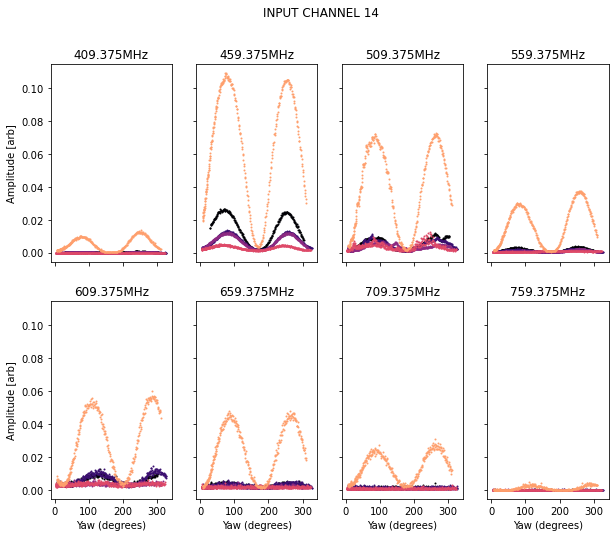

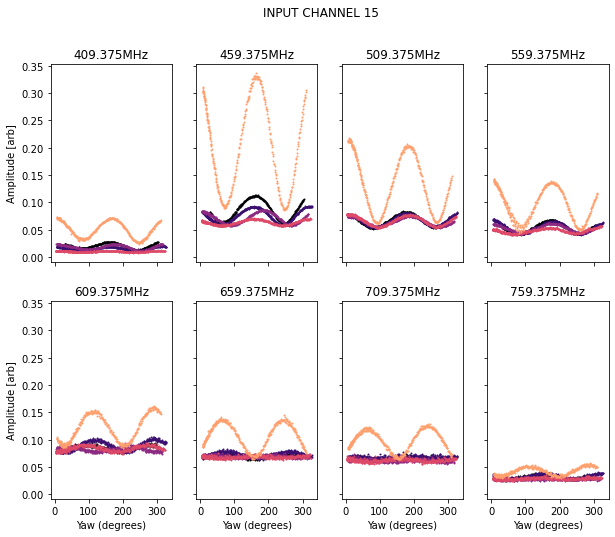

In [4]:
nn = -88
shiftedyaw = np.roll(concattest.drone_yaw_interp,nn)

#pos0 = np.arange(6900+nn, 7370+nn)
# change pos0 to only use a 0-360 part
pos0 = np.arange(7100+nn, 7380+nn)
pos1 = np.arange(8140+nn,8650+nn)
pos2 = np.arange(9150+nn,9550+nn)
pos3 = np.arange(10060+nn,10500+nn)
pos4 = np.arange(10950+nn,11300+nn)


poss = [pos0,pos1,pos2,pos3,pos4]
lp = 5

# Plot positions in X,Y 
for k in np.arange(5):
    plot(concattest.drone_xyz_LC_interp[poss[k],0], concattest.drone_xyz_LC_interp[poss[k],1], 
         marker='o',color=colorz[k],label='Position '+str(k))
plt.legend()
plt.show()

# Plot yaw and shifted yaw
plot(np.arange(len(concattest.drone_yaw_interp)),shiftedyaw,marker=',',color='red',label='shifted')
plot(np.arange(len(concattest.drone_yaw_interp)),concattest.drone_yaw_interp,marker=',',color='black',label='unshifted')
for k in np.arange(5):
    plt.axvspan(poss[k][0],poss[k][-1],color='blue',alpha=0.3)
plt.legend()
plt.xlim(6000,12000)
plt.title('Yaw and shifted Yaw')
plt.show()

# Plot yaw for each segment
for k in np.arange(5):
    plot(shiftedyaw[poss[k]],marker=',',color=colorz[k],label='Position '+str(k))
plt.legend()
plt.title('Ampitude vs shifted Yaw')
plt.show()

# Plot telescope signal as a funciton of yaw
for pol in np.arange(0,16):

    fig,axs = plt.subplots(2, 4, sharex=True,sharey=True,figsize=(10,8))
    for i, freq in enumerate(np.arange(1000,0,-128)):      
        for k in np.arange(5):
            if i<4: 
                r = 0
                c = i
            else:
                r = 1
                c = i-4
            axs[r,c].plot(shiftedyaw[poss[k]], 
                1e7*(concattest.V[poss[k],freq,pol]), '.', markersize = 2,color=colorz[k])
            axs[r,c].set_title(str(freqs[freq])+'MHz')
    axs[0,0].set_ylabel('Amplitude [arb]')
    axs[1,0].set_ylabel('Amplitude [arb]')
    axs[1,0].set_xlabel('Yaw (degrees)')
    axs[1,1].set_xlabel('Yaw (degrees)')
    axs[1,2].set_xlabel('Yaw (degrees)')
    axs[1,3].set_xlabel('Yaw (degrees)')
    fig.suptitle('INPUT CHANNEL '+str(pol))

    fig.show()
    
    







# Do some basic fit checks, and then fit all locations, feeds, frequencies

In [5]:
# Notes about channels:
#0/1 : normal keep; here ok 
#2/3 : normal keep; here ok
#4/5 : usually mixed co/cross so removed in regular analysis; here ok but skip anyway
#6/7 : no good amplitude fits, but these are CHIME channels ; have to keep but not all locations are good
#8/9 : input 9 saturated for all flights, removed companion 8 as well ; saturated here too
#10/11 : normal keep ; here ok
#12/13 : usually mixed co/cross so removed in regular analysis; 13 is clock
#14/15 : normal keep ; here ok



goodpols = [0,1,2,3,10,11,14,15]
chimepols = [6,7]
allgoodpols = [0,1,2,3,6,7,10,11,14,15]
N_pols = [1,3,7,11,15]
E_pols = [0,2,6,10,14]



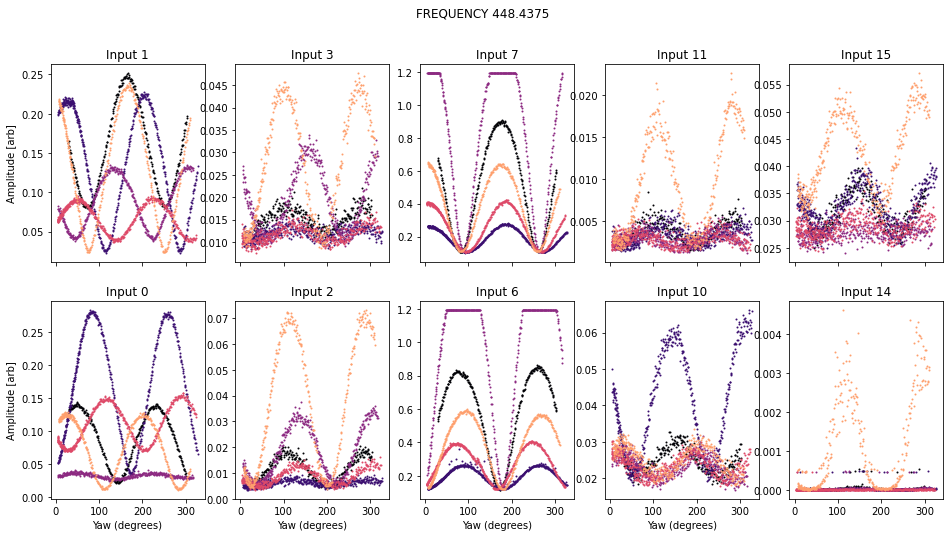

In [6]:
fig,axs = plt.subplots(2,5, sharex=True,figsize=(16,8))
find = 900
for p,chind in enumerate(N_pols):
    for k in np.arange(lp):
        axs[0,p].plot(shiftedyaw[poss[k]], 
                1e7*(concattest.V[poss[k],freq,chind]), '.', 
                      markersize = 2,color=colorz[k],label='loc'+str(k))
        axs[0,p].set_title('Input '+str(chind))
for p,chind in enumerate(E_pols):
    for k in np.arange(lp):
        axs[1,p].plot(shiftedyaw[poss[k]], 
                1e7*(concattest.V[poss[k],freq,chind]), '.', 
                      markersize = 2,color=colorz[k],label='loc'+str(k))
        axs[1,p].set_title('Input '+str(chind))
axs[0,0].set_ylabel('Amplitude [arb]')
axs[1,0].set_ylabel('Amplitude [arb]')
axs[1,0].set_xlabel('Yaw (degrees)')
axs[1,1].set_xlabel('Yaw (degrees)')
axs[1,2].set_xlabel('Yaw (degrees)')
axs[1,3].set_xlabel('Yaw (degrees)')
fig.suptitle('FREQUENCY '+str(freqs[find]))

fig.show()

In [7]:
def cos2_fun(x,*params):
    
    [a,b,c,d] = params   
    return a*(np.cos(b*(np.radians(x)-c)))**2 + d 

def get_chi2(x,y,*params):
    yfunc = cos2_fun(x,*params)
    return np.sum((y - yfunc)**2)/len(y)

def get_restrictedphase(angles,fits):
    func = cos2_fun(angles,*fits)
    return func

def get_shiftedphase(astr):
    n = len(astr)
    ll = 110
    print(n)
    corrstream = astr
    for i in np.arange(0,n-1):
        #print(abs(corrstream[i+1] - corrstream[i]))
        if (corrstream[i+1] - corrstream[i] > ll) or (corrstream[i+1] - corrstream[i]) < -1*ll:
            #print(i, 'got one! OLD: ', corrstream[i+1], corrstream[i])
            corrfac = -1.0*np.sign(corrstream[i+1] - corrstream[i])*180.0
            corrstream[i+1]= corrstream[i+1]+corrfac
            #print('NEW: ',corrstream[i+1])
    return corrstream

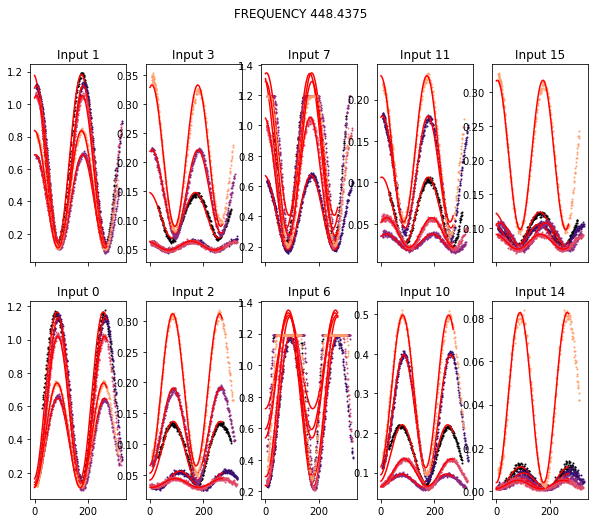

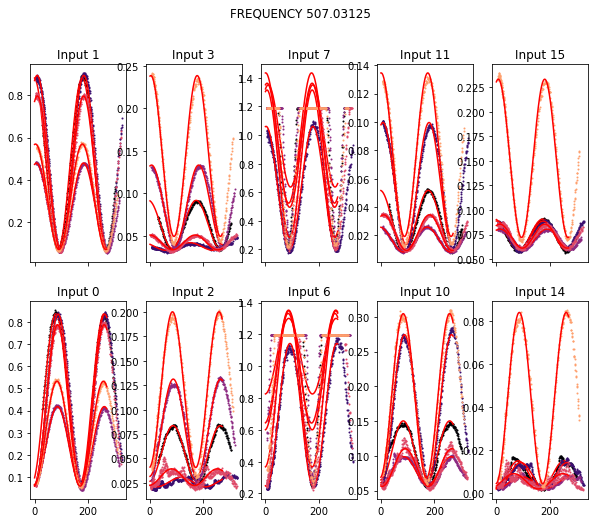

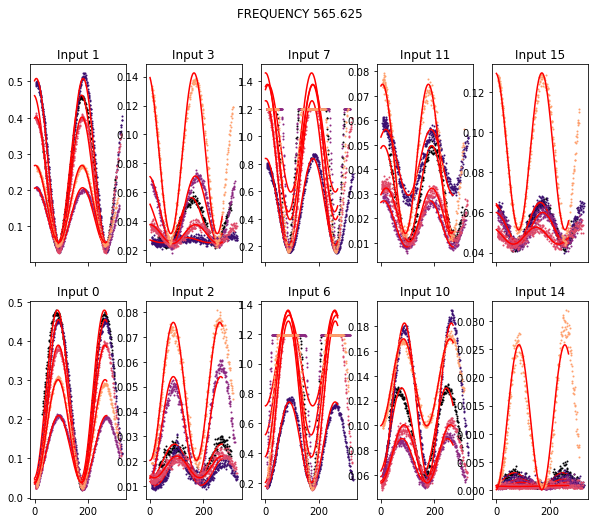

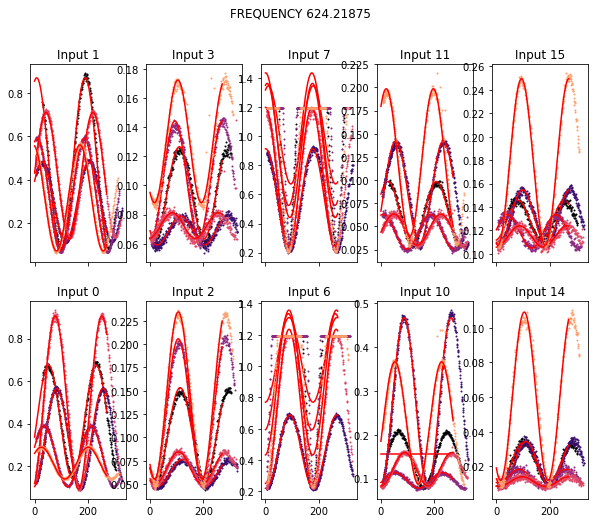

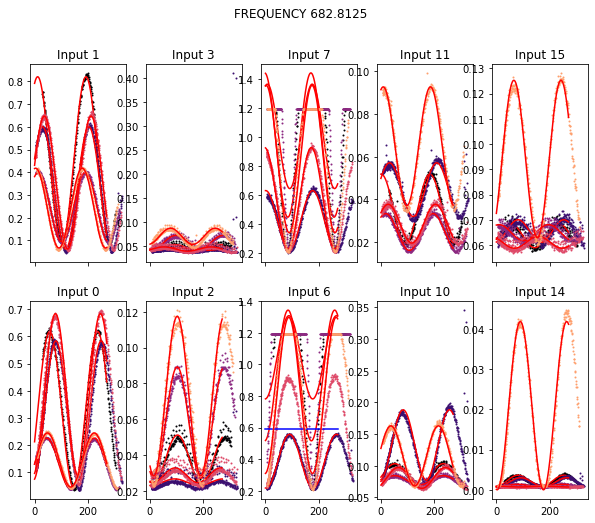

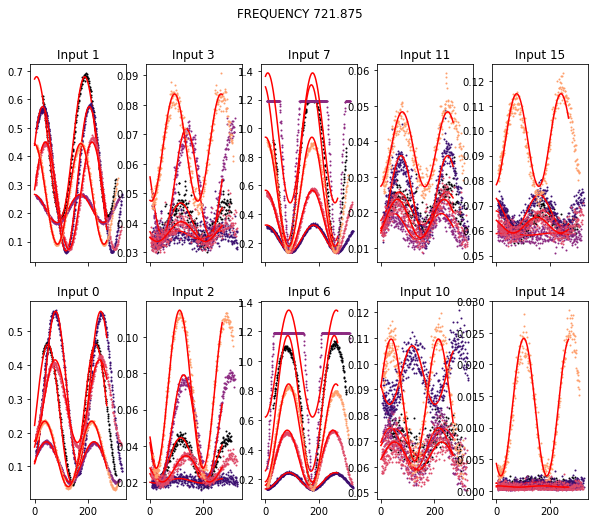

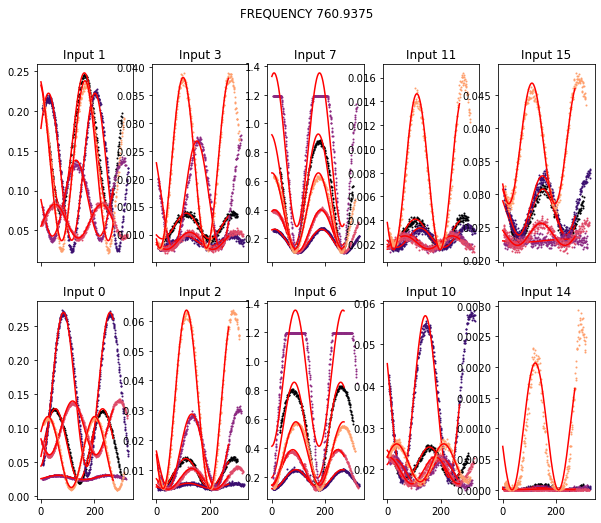

In [8]:
poss = [pos0,pos1,pos2,pos3,pos4]
lp = len(poss)
bnds = ((0, 0.5,-np.pi/2, 0),(2.0, 1.5,np.pi, 1.0))

pG = [0.5,1.0,-0.5,0.1]

for i, find in enumerate([900,750,600,450,300,200,100]): 
    fig,axs = plt.subplots(2,5, sharex=True,figsize=(10,8))
    for p,chind in enumerate(N_pols):
        for k in np.arange(lp):
            axs[0,p].plot(shiftedyaw[poss[k]], 
                1e7*(concattest.V[poss[k],find,chind]), '.', 
                      markersize = 2,color=colorz[k],label='loc'+str(k))
            try:
                gi = np.where(1e7*(concattest.V[poss[k],find,chind]) < 1.191)[0]
                popt, pcov = opt.curve_fit(cos2_fun, shiftedyaw[poss[k]], \
                        1e7*(concattest.V[poss[k],find,chind]), p0=pG,bounds=bnds)
                ch2 = get_chi2(shiftedyaw[poss[k]],1e7*(concattest.V[poss[k],find,chind]),*popt)
                if ch2>0.054:
                    axs[0,p].plot(np.linspace(0,270,270), cos2_fun(np.linspace(0,270,270), *popt), 'b')
                else: axs[0,p].plot(np.linspace(0,270,270), cos2_fun(np.linspace(0,270,270), *popt), 'r')
                #print(freqs[find],chind,k,ch2*1E5)
            except:''
            axs[0,p].set_title('Input '+str(chind))
    for p,chind in enumerate(E_pols):
        for k in np.arange(lp):
            axs[1,p].plot(shiftedyaw[poss[k]], 
                1e7*(concattest.V[poss[k],find,chind]), '.', 
                      markersize = 2,color=colorz[k],label='loc'+str(k))
            try:
                gi = np.where(1e7*(concattest.V[poss[k],find,chind]) < 1.191)[0]
                popt, pcov = opt.curve_fit(cos2_fun, shiftedyaw[poss[k]], \
                        1e7*(concattest.V[poss[k],find,chind]), p0=pG,bounds=bnds)
                ch2 = get_chi2(shiftedyaw[poss[k]],1e7*(concattest.V[poss[k],find,chind]),*popt)
                if ch2>0.054:
                    axs[1,p].plot(np.linspace(0,270,270), cos2_fun(np.linspace(0,270,270), *popt), 'b')
                else: axs[1,p].plot(np.linspace(0,270,270), cos2_fun(np.linspace(0,270,270), *popt), 'r')
                #print(freqs[find],chind,k,ch2*1E5)
            except:''
            axs[1,p].set_title('Input '+str(chind))
    fig.suptitle('FREQUENCY '+str(freqs[find]))

    fig.show()
    
    
# Chi2 values of 0.054 or higher seem to be bad fits, although doesn't skew the plots below
# don't cut based on this yet

In [9]:
## This fits all positions, includes a calculation of chi2

poss = [pos0,pos1,pos2,pos3,pos4]
lp = len(poss)
fits = np.zeros((lp,5,16,1024))

for fi,find in enumerate(np.arange(0,1024)):
    for p,chind in enumerate(allgoodpols):
        for k in np.arange(lp):
            try:
                gi = np.where(1e7*(concattest.V[poss[k],find,chind]) < 1.19)[0]
                popt, pcov = opt.curve_fit(cos2_fun, shiftedyaw[poss[k][gi]], \
                        1e7*(concattest.V[poss[k][gi],find,chind]), p0=pG,bounds=bnds)
                fits[0:4,k,chind,find] = popt
                ch2 = get_chi2(shiftedyaw[poss[k][gi]],1e7*(concattest.V[poss[k][gi],find,chind]),*popt)
                fits[4,k,chind,find] = ch2
            except:''

/home/ln267/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


# Basic plots - check phase and amplitude ratios

median phase, lower band:  0 88.05146963692839
median phase, upper band:  0 79.91770308028339
median phase, lower band:  1 8.003659250259096
median phase, upper band:  1 36.86211994914992
median phase, lower band:  2 89.8736102851084
median phase, upper band:  2 47.20506870390926
median phase, lower band:  3 7.3723042503135945
median phase, upper band:  3 57.41970002529779
median phase, lower band:  6 88.49117623191219
median phase, upper band:  6 89.99999999999999
median phase, lower band:  7 3.617828865492049
median phase, upper band:  7 5.640998106525281
median phase, lower band:  10 89.00165165914424
median phase, upper band:  10 50.94563476247185
median phase, lower band:  11 10.396993797686775
median phase, upper band:  11 43.97713546941021
median phase, lower band:  14 89.99930507945683
median phase, upper band:  14 15.945519224842009
median phase, lower band:  15 7.484818943108833
median phase, upper band:  15 23.10564139998883


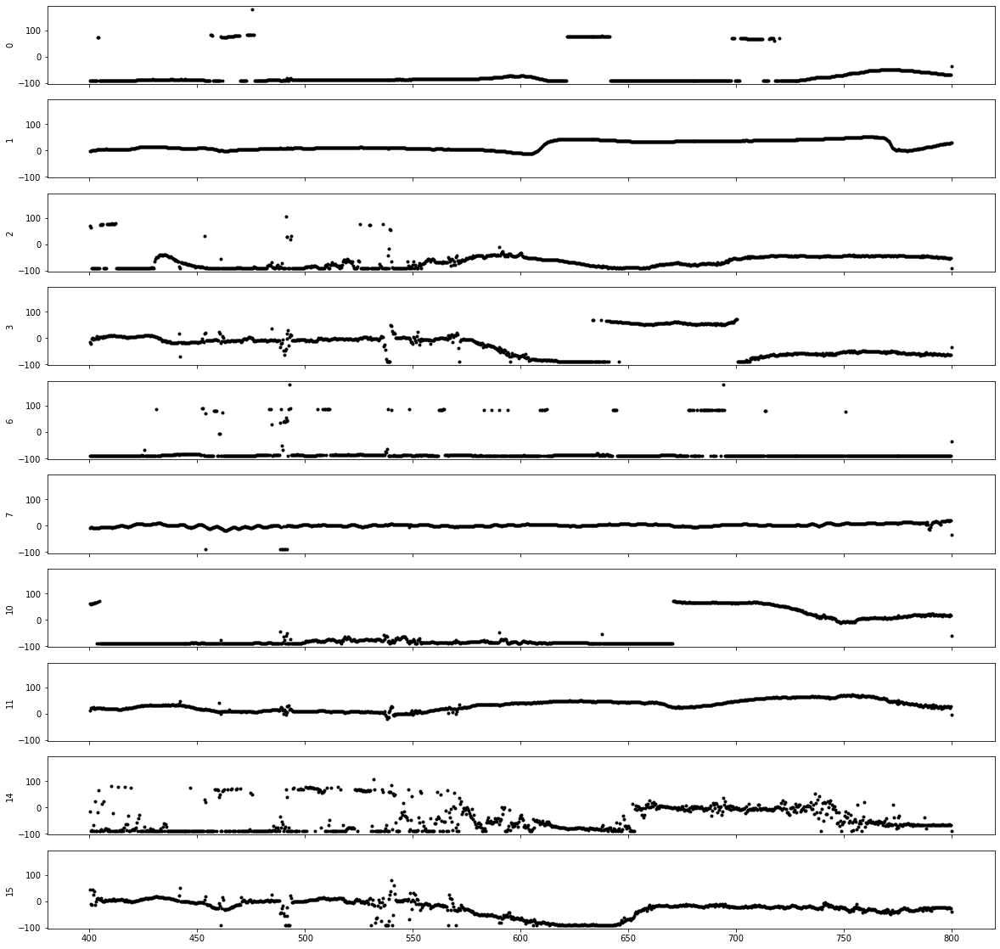

median amp ratio, lower band:  0 0 0.93996284575002
median amp ratio, lower band:  0 1 0.9359858255649143
median amp ratio, lower band:  0 2 0.8249890521930527
median amp ratio, lower band:  0 3 0.9664965957310747
median amp ratio, lower band:  0 4 0.9391016005772511
median amp ratio, lower band:  2 0 1.0966250610771104
median amp ratio, lower band:  2 1 0.9763643311015282
median amp ratio, lower band:  2 2 1.1060582443173534
median amp ratio, lower band:  2 3 0.8190902048499595
median amp ratio, lower band:  2 4 0.8567346616710054
median amp ratio, lower band:  6 0 0.9031602245525149
median amp ratio, lower band:  6 1 1.0678072366869698
median amp ratio, lower band:  6 2 1.0
median amp ratio, lower band:  6 3 1.1326684470690496
median amp ratio, lower band:  6 4 1.0
median amp ratio, lower band:  10 0 1.9476399432745486
median amp ratio, lower band:  10 1 2.4447836796376983
median amp ratio, lower band:  10 2 1.920587744901882
median amp ratio, lower band:  10 3 2.0974519277747103
med

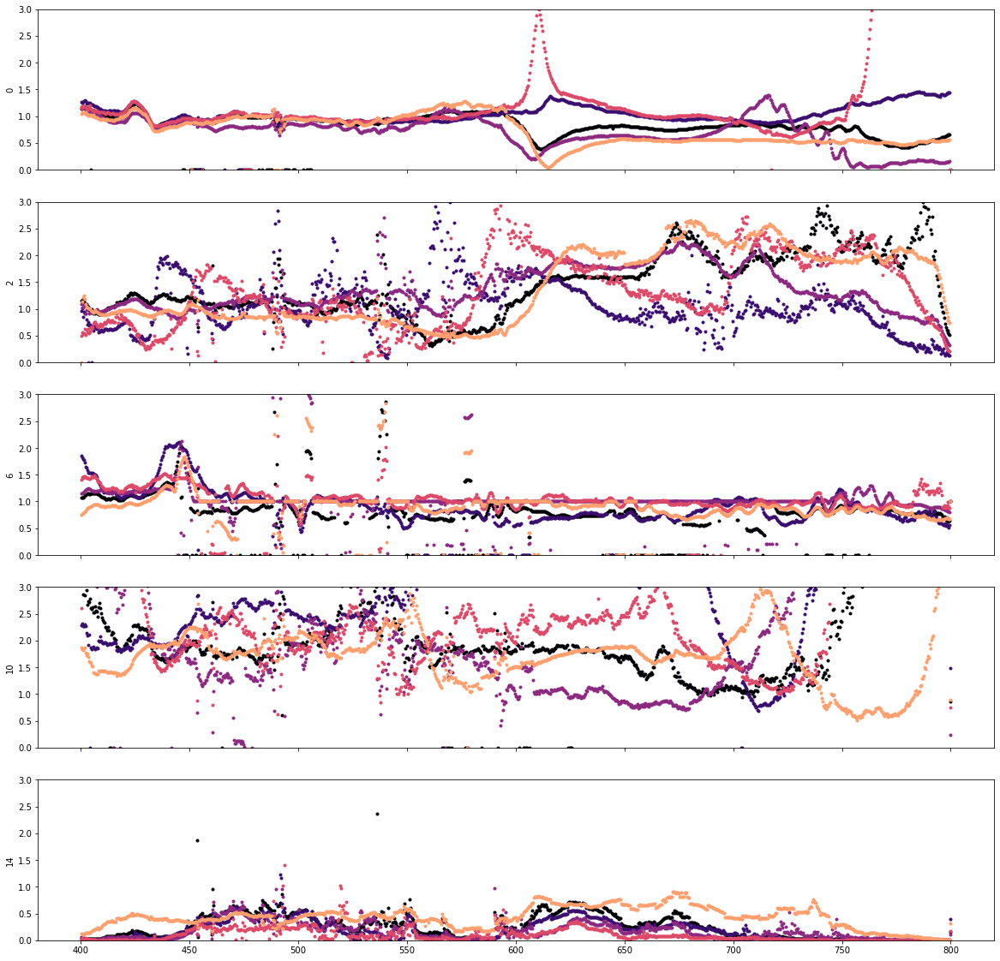

In [114]:
# Plot phase
fig,axs = plt.subplots(10, sharex=True,sharey=True,figsize=(20,20))
#for fi in np.arange(len(fits[:,0,0,0])): # fit param
fi = 2
k = 3#4
lp = 1
badfreqs=[]

for p,chind in enumerate(allgoodpols):
    axs[p].plot(freqs,np.degrees(fits[fi,k,chind,:]),
                  color='black',marker='.',linestyle='None')
    axs[p].set_ylabel(str(chind))
    print('median phase, lower band: ', chind, np.median(np.abs(np.degrees(fits[fi,k,chind,600:1024]))))
    print('median phase, upper band: ', chind, np.median(np.abs(np.degrees(fits[fi,k,chind,0:400]))))
plt.show()
   
fig,axs = plt.subplots(5, sharex=True,sharey=True,figsize=(20,20))
colorz=pu.cm_to_discrete(ccm,5)
for p,chind in enumerate(E_pols):
    for k in np.arange(len(poss)):
        axs[p].plot(freqs,fits[0,k,chind,:]/fits[0,k,chind+1,:],
                  color=colorz[k],marker='.',linestyle='None')
        axs[p].set_ylabel(str(chind))
        print('median amp ratio, lower band: ', chind, k, 
              np.median(fits[0,k,chind,600:1024]/fits[0,k,chind+1,600:1024]))
axs[0].set_ylim(0,3)
plt.show()

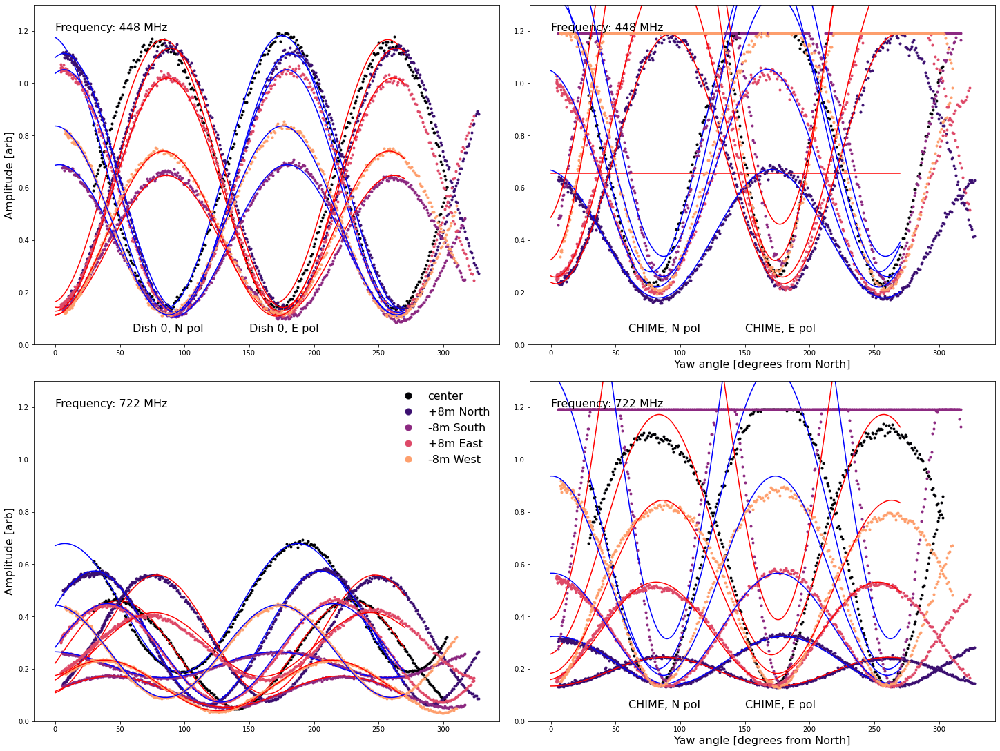

In [46]:
### Lets look at all locations, a few frequencies (selected by paper set)

colorz=pu.cm_to_discrete(ccm,5)
poss = [pos0,pos1,pos2,pos3,pos4]
lp = len(poss)
msiz = 6
locz = ['center','+8m North','-8m South','+8m East','-8m West']

fig = plt.figure(constrained_layout=True,figsize=(20,15))

gs = GridSpec(2, 2, figure=fig)
axs0 = fig.add_subplot(gs[0, 0])
axs1 = fig.add_subplot(gs[1, 0])
axs2 = fig.add_subplot(gs[0, 1])
axs3 = fig.add_subplot(gs[1, 1])

for k in np.arange(lp):
    find = 900
    chind1 = 0
    chind2 = 1
    axs0.plot(shiftedyaw[poss[k]], 
            1e7*(concattest.V[poss[k],find,chind1]), '.', 
                    markersize = msiz,color=colorz[k])
    axs0.plot(shiftedyaw[poss[k]], 
                1e7*(concattest.V[poss[k],find,chind2]), '.', 
                      markersize = msiz,color=colorz[k])
    axs0.plot(np.linspace(0,270,270), cos2_fun(np.linspace(0,270,270), *fits[0:4,k,chind1,find]), 'r')
    axs0.plot(np.linspace(0,270,270), cos2_fun(np.linspace(0,270,270), *fits[0:4,k,chind2,find]), 'b')
    find=200
    axs1.plot(shiftedyaw[poss[k]], 
            1e7*(concattest.V[poss[k],find,chind1]), '.', 
                    markersize = msiz,color=colorz[k],label=locz[k])
    axs1.plot(shiftedyaw[poss[k]], 
                1e7*(concattest.V[poss[k],find,chind2]), '.', 
                      markersize = msiz,color=colorz[k])
    axs1.plot(np.linspace(0,270,270), cos2_fun(np.linspace(0,270,270), *fits[0:4,k,chind1,find]), 'r')
    axs1.plot(np.linspace(0,270,270), cos2_fun(np.linspace(0,270,270), *fits[0:4,k,chind2,find]), 'b')
    find = 900
    chind1 = 6
    chind2 = 7
    axs2.plot(shiftedyaw[poss[k]], 
            1e7*(concattest.V[poss[k],find,chind1]), '.', 
                    markersize = msiz,color=colorz[k])
    axs2.plot(shiftedyaw[poss[k]], 
                1e7*(concattest.V[poss[k],find,chind2]), '.', 
                      markersize = msiz,color=colorz[k])
    axs2.plot(np.linspace(0,270,270), cos2_fun(np.linspace(0,270,270), *fits[0:4,k,chind1,find]), 'r')
    axs2.plot(np.linspace(0,270,270), cos2_fun(np.linspace(0,270,270), *fits[0:4,k,chind2,find]), 'b')
    find=200
    axs3.plot(shiftedyaw[poss[k]], 
            1e7*(concattest.V[poss[k],find,chind1]), '.', 
                    markersize = msiz,color=colorz[k])
    axs3.plot(shiftedyaw[poss[k]], 
                1e7*(concattest.V[poss[k],find,chind2]), '.', 
                      markersize = msiz,color=colorz[k])
    axs3.plot(np.linspace(0,270,270), cos2_fun(np.linspace(0,270,270), *fits[0:4,k,chind1,find]), 'r')
    axs3.plot(np.linspace(0,270,270), cos2_fun(np.linspace(0,270,270), *fits[0:4,k,chind2,find]), 'b')
    
axs0.text(0,1.2,'Frequency: 448 MHz',fontsize=16)
axs0.text(150,0.05,'Dish 0, E pol',color='black',fontsize=16)
axs0.text(60,0.05,'Dish 0, N pol',color='black',fontsize=16)
axs0.set_ylabel('Amplitude [arb]',fontsize=16)
axs0.set_ylim(0,1.3)
axs1.legend(loc='upper right',fontsize=16,markerscale=3,frameon=False)

axs1.text(0,1.2,'Frequency: 722 MHz',fontsize=16)
#axs1.text(240,0.85,'Input 0',color='black',fontsize=16)
#axs1.text(240,0.7,'Input 1',color='black',fontsize=16)
axs1.set_ylabel('Amplitude [arb]',fontsize=16)
axs1.set_ylim(0,1.3)

axs2.text(0,1.2,'Frequency: 448 MHz',fontsize=16)
axs2.text(150,0.05,'CHIME, E pol',color='black',fontsize=16)
axs2.text(60,0.05,'CHIME, N pol',color='black',fontsize=16)
axs2.set_xlabel('Yaw angle [degrees from North]',fontsize=16)
axs2.set_ylim(0,1.3)

axs3.text(0,1.2,'Frequency: 722 MHz',fontsize=16)
axs3.text(150,0.05,'CHIME, E pol',color='black',fontsize=16)
axs3.text(60,0.05,'CHIME, N pol',color='black',fontsize=16)
axs3.set_xlabel('Yaw angle [degrees from North]',fontsize=16)
axs3.set_ylim(0,1.3)


plt.show()
fig.clf()

In [13]:
chind = 0
find = 900
fi = 2
k = 0
print('E pol locations: ',fits[fi,:,chind,find])
print('N pol locations: ',fits[fi,:,chind+1,find])

E pol locations:  [-1.57079633 -1.49229937 -1.57079633 -1.52364235  1.46405957]
N pol locations:  [-0.07800473  0.12259085  0.0552364   0.12035143 -0.00601167]


[2.61833241e-14 4.14746246e-06 3.93044053e-06 ... 1.00079107e-05
 8.86703897e-06 7.80471620e-06]
[1.05807947e-05 3.94907805e-09 3.94586303e-09 ... 1.85584614e-06
 1.90850532e-06 1.79220172e-06]
[2.61833241e-14 5.63768121e-04 1.15658204e-03 ... 8.31704556e-05
 8.72764150e-05 8.17659812e-05]
[7.12277447e-06 8.58309751e-08 8.50696113e-08 ... 5.74398732e-06
 6.54875749e-06 5.94443719e-06]
[1.46662755e-06 2.84358515e-11 2.87198362e-11 ... 3.45876612e-08
 2.72621431e-08 3.51417457e-08]


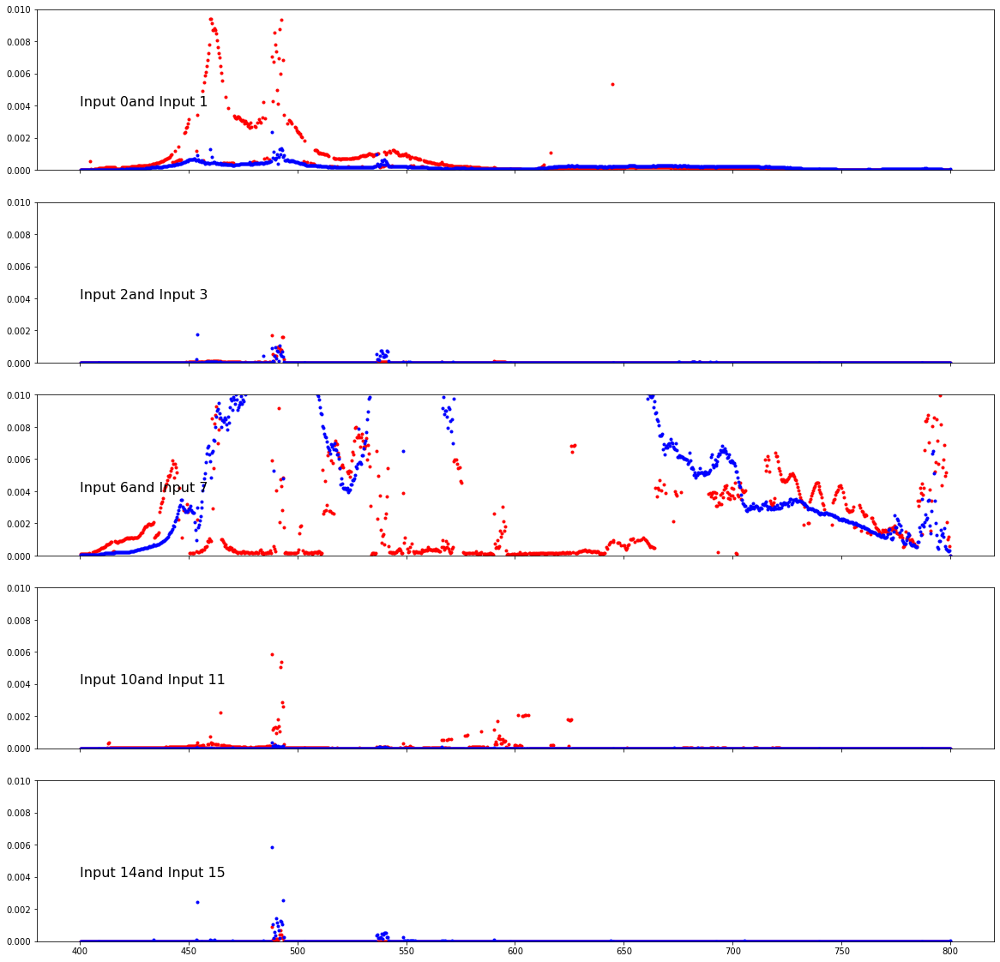

In [90]:
bv = 0.1
fig,axs = plt.subplots(5, sharex=True,sharey=True,figsize=(20,20))
fi = 4

k = 0#3#1 # change this one

for p,chind in enumerate(E_pols):
    
    esigo = fits[fi,k,chind,:]
    nsigo = fits[fi,k,chind+1,:]
    print(esigo)
    axs[p].plot(freqs,esigo,
                  color='red',marker='.',linestyle='None')
    axs[p].plot(freqs,nsigo,
                  color='blue',marker='.',linestyle='None')
    axs[p].text(400,0.004,'Input '+str(chind)+'and Input '+str(chind+1),fontsize=16)
axs[0].set_ylim(0,0.01)
#axs[0].set_title('Phase Difference between E pol and N pol')
#axs[2].text(400,175,'CHIME FEED',fontsize=22)
plt.show()

1006
1023
826
1019
1020


Text(400, 175, 'CHIME FEED')

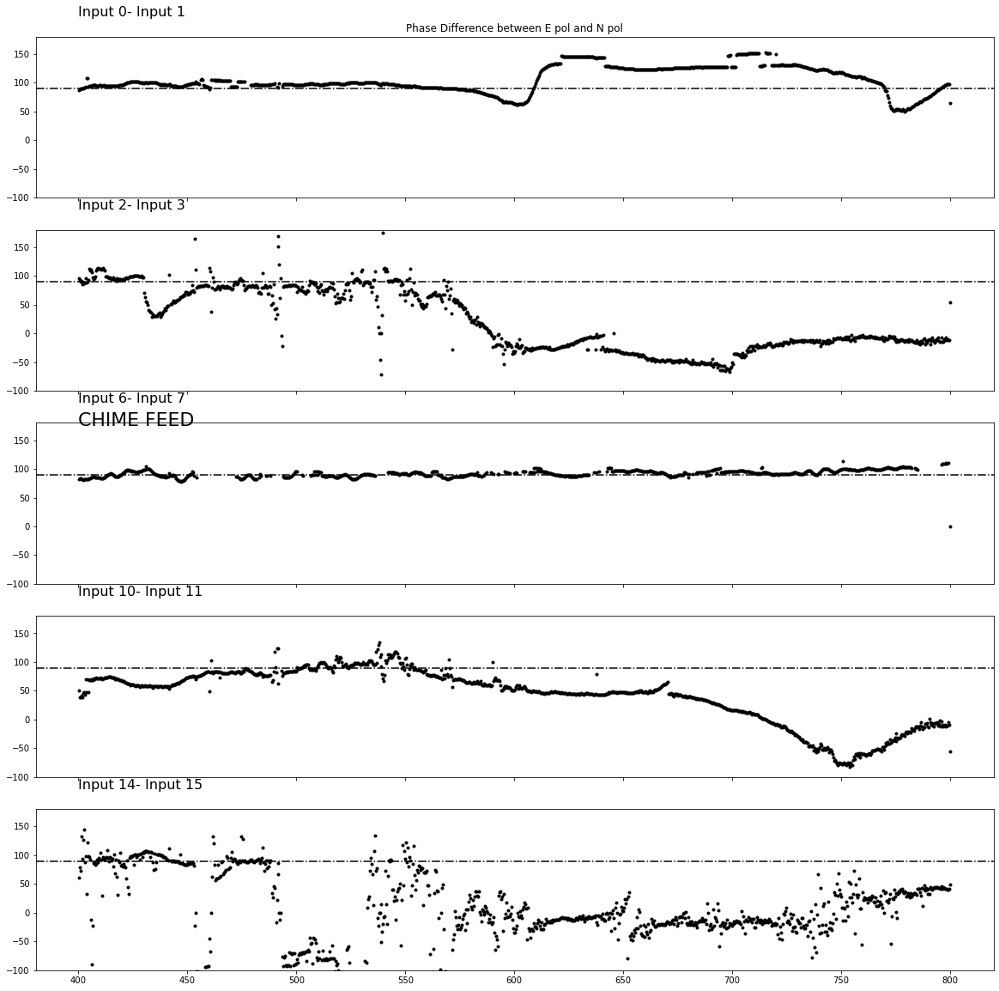

In [93]:




bv = 0.003
fig,axs = plt.subplots(5, sharex=True,sharey=True,figsize=(20,20))
fi = 2

k = 3#1 # change this one

for p,chind in enumerate(E_pols):
    gfrs = np.where((fits[4,k,chind,:] < bv) & (fits[4,k,chind+1,:] < bv) )[0]
    
    esigo = fits[fi,k,chind,gfrs]
    nsigo = fits[fi,k,chind+1,gfrs]
    diffo = (180/np.pi)*(nsigo-esigo)
    diff = diffo
    diff = get_shiftedphase(diffo)
    
    if diff[-1] < 0.0: diff = diff*-1.0
    
    axs[p].plot(freqs[gfrs],diff,
                  color='black',marker='.',linestyle='None')
    axs[p].text(400,215,'Input '+str(chind)+'- Input '+str(chind+1),fontsize=16)
    axs[p].axhline(90,color='black',ls='-.')
    #axs[p].axhline(0.0,color='yellow')
axs[0].set_ylim(-100,180)
axs[0].set_title('Phase Difference between E pol and N pol')
axs[2].text(400,175,'CHIME FEED',fontsize=22)

1006
1023
1019
826


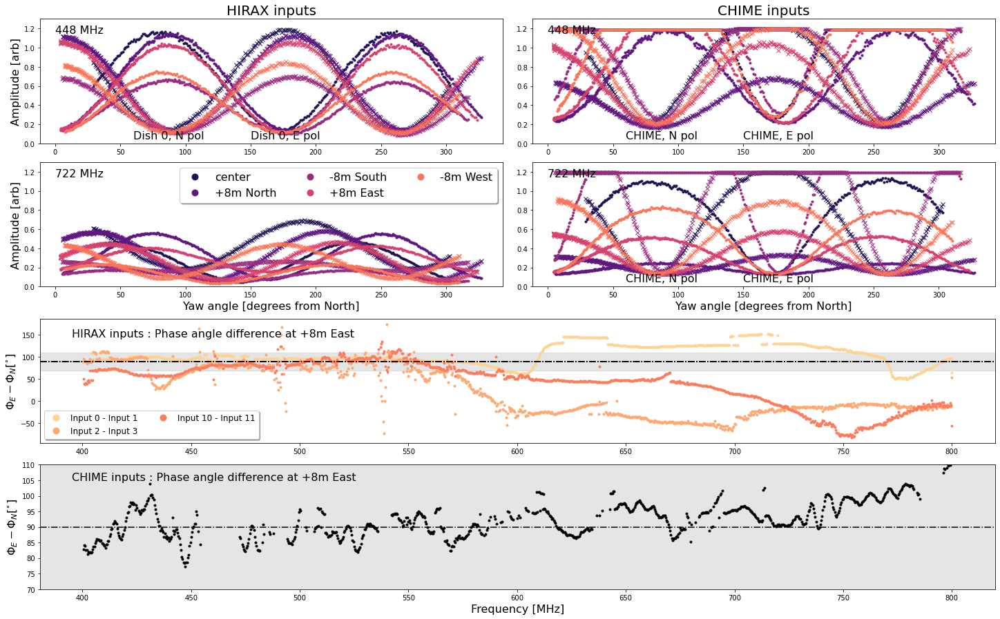

In [101]:
### Try 2 for paper

colorp=pu.cm_to_discrete(ccm,7)
poss = [pos0,pos1,pos2,pos3,pos4]
lp = [0,1,2,3,4]

fi = 2 # phase
pp = 3 # which position of [pos0,1,2,3,4]
bv = 0.003 # limit for good chi2


msiz = 6
locz = ['center','+8m North','-8m South','+8m East','-8m West']
colorz=pu.cm_to_discrete(ccm,11)


fig = plt.figure(constrained_layout=True,figsize=(20,15))

gs = GridSpec(5, 2, figure=fig)
axs0 = fig.add_subplot(gs[0, 0])
axs1 = fig.add_subplot(gs[1, 0])
axs2 = fig.add_subplot(gs[0, 1])
axs3 = fig.add_subplot(gs[1, 1])
axs5 = fig.add_subplot(gs[2, :])
axs6 = fig.add_subplot(gs[3, :])


for k in lp:
    find = 900
    chind1 = 0
    chind2 = 1
    axs0.plot(shiftedyaw[poss[k]], 
            1e7*(concattest.V[poss[k],find,chind1]), '.', 
                    markersize = msiz,color=colorp[k+1])
    axs0.plot(shiftedyaw[poss[k]], 
                1e7*(concattest.V[poss[k],find,chind2]), 'x', 
                      markersize = msiz,color=colorp[k+1])
    find=200
    axs1.plot(shiftedyaw[poss[k]], 
            1e7*(concattest.V[poss[k],find,chind1]), '.', 
                    markersize = msiz,color=colorp[k+1],label=locz[k])
    axs1.plot(shiftedyaw[poss[k]], 
                1e7*(concattest.V[poss[k],find,chind2]), 'x', 
                      markersize = msiz,color=colorp[k+1])

    find = 900
    chind1 = 6
    chind2 = 7
    axs2.plot(shiftedyaw[poss[k]], 
            1e7*(concattest.V[poss[k],find,chind1]), '.', 
                    markersize = msiz,color=colorp[k+1])
    axs2.plot(shiftedyaw[poss[k]], 
                1e7*(concattest.V[poss[k],find,chind2]), 'x', 
                      markersize = msiz,color=colorp[k+1])
    find=200
    axs3.plot(shiftedyaw[poss[k]], 
            1e7*(concattest.V[poss[k],find,chind1]), '.', 
                    markersize = msiz,color=colorp[k+1])
    axs3.plot(shiftedyaw[poss[k]], 
                1e7*(concattest.V[poss[k],find,chind2]), 'x', 
                      markersize = msiz,color=colorp[k+1])
    


for p,chind in enumerate([0,2,10]):
    gfrs = np.where((fits[4,pp,chind,:] < bv) & (fits[4,pp,chind+1,:] < bv) )[0]
    
    esigo = fits[fi,pp,chind,gfrs]
    nsigo = fits[fi,pp,chind+1,gfrs]
    diffo = (180/np.pi)*(nsigo-esigo)    
    diff = get_shiftedphase(diffo)
    
    if diff[-1] < 0.0: diff = diff*-1.0  

    axs5.plot(freqs[gfrs],diff,
                 color=colorz[10-p],marker='.',
                markersize=msiz,linestyle='None',label='Input '+str(chind)+' - Input '+str(chind+1))
    axs5.axhline(90,color='black',ls='-.')
    
chind = 6
gfrs = np.where((fits[4,pp,chind,:] < bv) & (fits[4,pp,chind+1,:] < bv) )[0]
esigo = fits[fi,pp,chind,gfrs]
nsigo = fits[fi,pp,chind+1,gfrs]
diffo = (180/np.pi)*(nsigo-esigo)    
diff = get_shiftedphase(diffo)
if diff[-1] < 0.0: diff = diff*-1.0  

axs6.plot(freqs[gfrs],diff,
                 color='black',marker='.',
          linestyle='None',label='Input '+str(chind)+' - Input '+str(chind+1))
axs6.axhline(90,color='black',ls='-.')
  
    
    
    
axs0.text(0,1.15,'448 MHz',fontsize=16)
axs0.text(150,0.05,'Dish 0, E pol',color='black',fontsize=16)
axs0.text(60,0.05,'Dish 0, N pol',color='black',fontsize=16)
axs0.set_ylabel('Amplitude [arb]',fontsize=16)
axs0.set_ylim(0,1.3)
axs0.set_title('HIRAX inputs',fontsize=20)

axs1.legend(loc='upper right',fontsize=16,markerscale=3,ncol=3,frameon=True,shadow=True)

axs1.text(0,1.15,'722 MHz',fontsize=16)
axs1.set_ylabel('Amplitude [arb]',fontsize=16)
axs1.set_ylim(0,1.3)
axs1.set_xlabel('Yaw angle [degrees from North]',fontsize=16)

axs2.text(0,1.15,'448 MHz',fontsize=16)
axs2.text(150,0.05,'CHIME, E pol',color='black',fontsize=16)
axs2.text(60,0.05,'CHIME, N pol',color='black',fontsize=16)
axs2.set_ylim(0,1.3)
axs2.set_title('CHIME inputs',fontsize=20)

axs3.text(0,1.15,'722 MHz',fontsize=16)
axs3.text(150,0.05,'CHIME, E pol',color='black',fontsize=16)
axs3.text(60,0.05,'CHIME, N pol',color='black',fontsize=16)
axs3.set_xlabel('Yaw angle [degrees from North]',fontsize=16)
axs3.set_ylim(0,1.3)



#axs5.set_xlabel('Frequency [MHz]',fontsize=16)
axs5.text(395,145,'HIRAX inputs : Phase angle difference at +8m East',fontsize=16)
axs5.legend(ncol=2,fontsize=12,markerscale=3,frameon=True,shadow=True)
axs5.set_ylabel(r'$\Phi_{E} - \Phi_{N} [^{\circ}]$',fontsize=16)
axs5.axhspan(70,110,color='grey',alpha=0.2)

axs6.set_xlabel('Frequency [MHz]',fontsize=16)
axs6.text(395,105,'CHIME inputs : Phase angle difference at +8m East',fontsize=16)
axs6.set_ylim(70,110)
axs6.set_ylabel(r'$\Phi_{E} - \Phi_{N} [^{\circ}]$',fontsize=16)
axs6.axhspan(70,110,color='grey',alpha=0.2)

plt.show()
fig.clf()

/home/ln267/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


Text(400, 175, 'CHIME FEED')

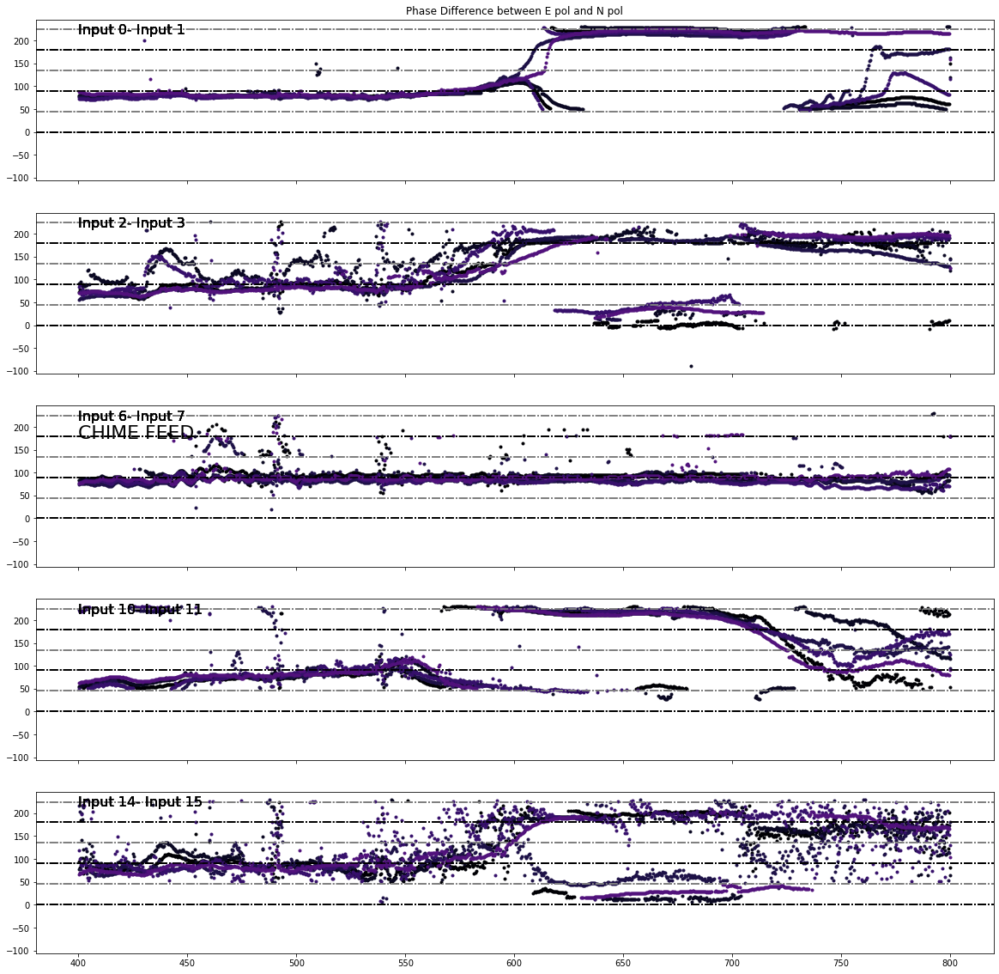

In [98]:
# plot the same as above but for all locations and see what happens:

fig,axs = plt.subplots(5, sharex=True,sharey=True,figsize=(20,20))
#for fi in np.arange(len(fits[:,0,0,0])): # fit param
fi = 2


for p,chind in enumerate(E_pols):
    for k in np.arange(lp):
        esig = fits[fi,k,chind,:]
        nsig = fits[fi,k,chind+1,:]
        diff = (180/np.pi)*(esig-nsig)+180
        for i in np.arange(0,1024):
            if diff[i] > 230: diff[i] = diff[i]-180
        axs[p].plot(freqs,diff,
                  color=colorz[k],marker='.',linestyle='None')
        #axs[p].set_ylim(0,4.5)
        axs[p].text(400,215,'Input '+str(chind)+'- Input '+str(chind+1),fontsize=16)
        axs[p].axhline(90,color='black',ls='-.')
        axs[p].axhline(180,color='black',ls='-.')
        axs[p].axhline(0,color='black',ls='-.')
        axs[p].axhline(90+45,color='grey',ls='-.')
        axs[p].axhline(180+45,color='grey',ls='-.')
        axs[p].axhline(0+45,color='grey',ls='-.')
        #axs[p].axhline(0.0,color='yellow')
axs[0].set_title('Phase Difference between E pol and N pol')
axs[2].text(400,175,'CHIME FEED',fontsize=22)

Text(400, 3, 'CHIME FEED')

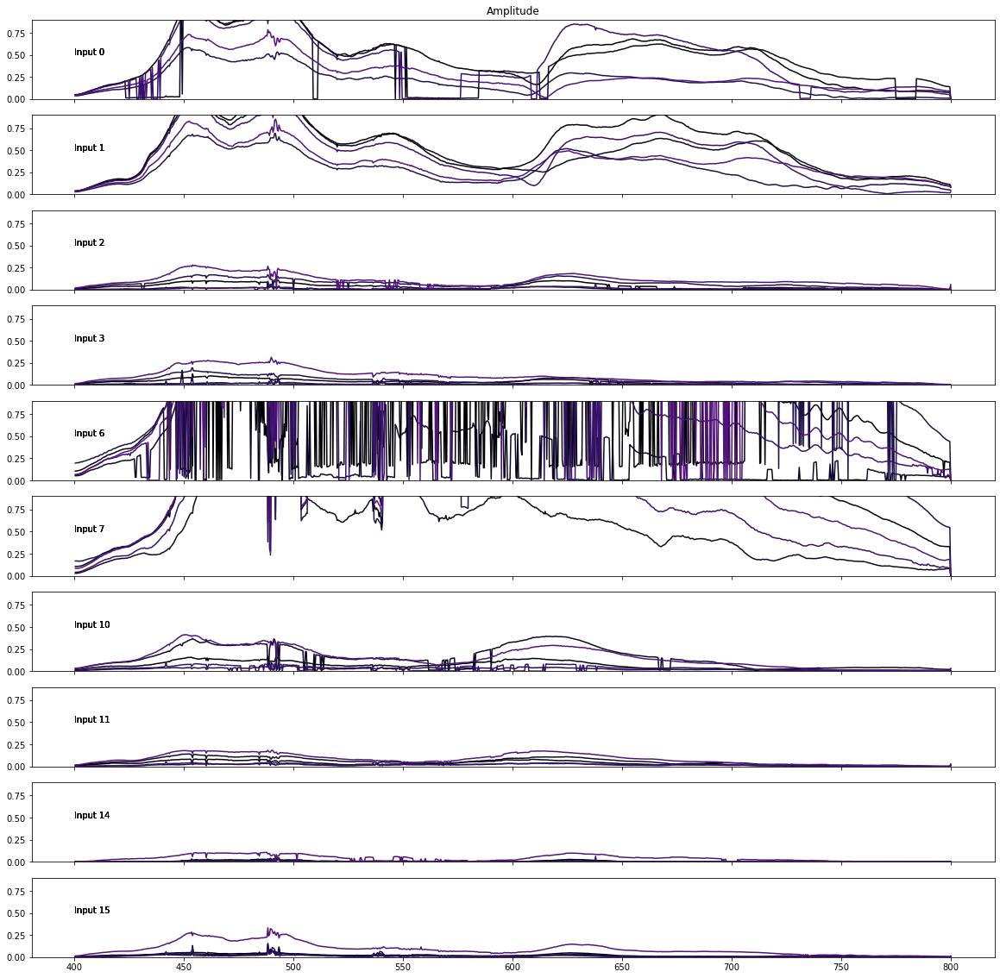

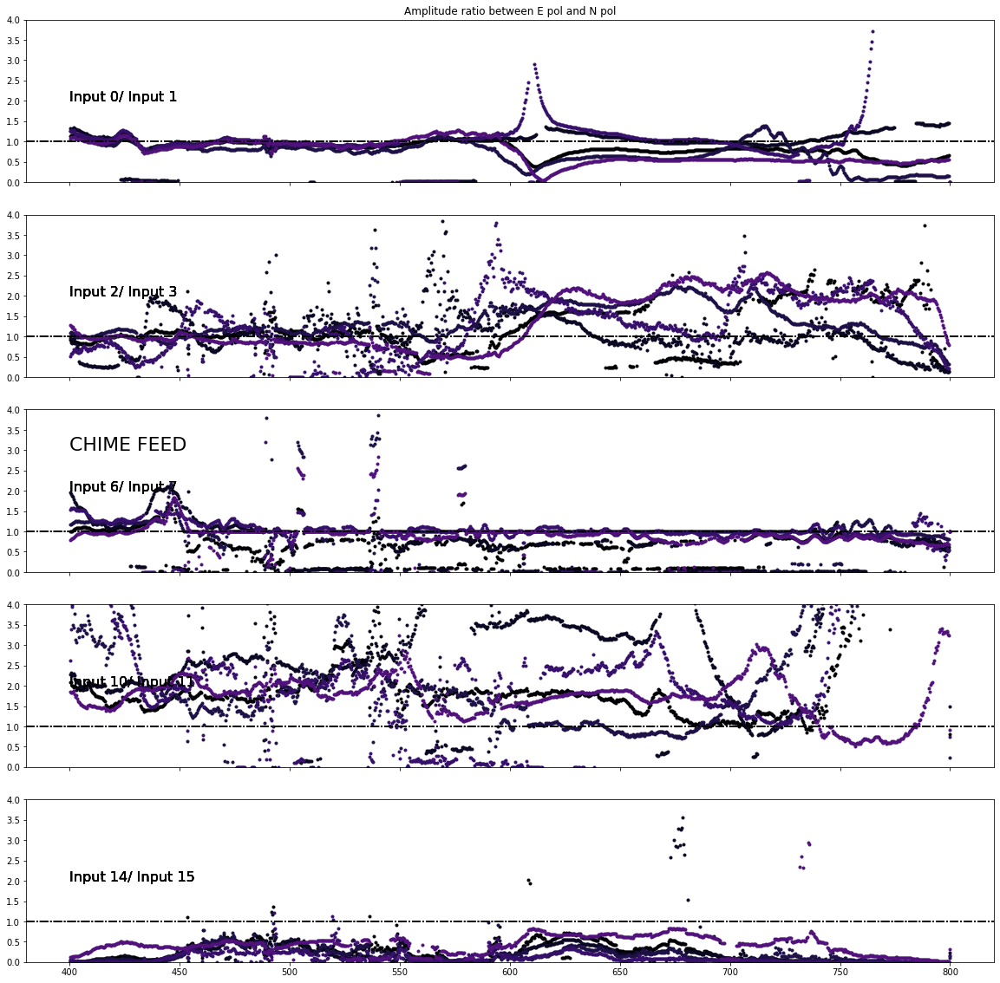

In [99]:
# Look at Amplitude
titles=['Amplitude','Period','Phase','Offset']
fig,axs = plt.subplots(10, sharex=True,figsize=(20,20))
#for fi in np.arange(len(fits[:,0,0,0])): # fit param
fi = 0
for p,chind in enumerate(allgoodpols):
    for k in np.arange(lp):
        axs[p].plot(freqs,fits[fi,k,chind,:],color=colorz[k])
        axs[p].set_ylim(0,0.9)
        axs[p].text(400,0.5,'Input '+str(chind))
axs[0].set_title(titles[fi])
    
fig.show() 

fig,axs = plt.subplots(5, sharex=True,sharey=True,figsize=(20,20))
#for fi in np.arange(len(fits[:,0,0,0])): # fit param
fi = 0


for p,chind in enumerate(E_pols):
    for k in np.arange(lp):
        esig = fits[fi,k,chind,:]
        nsig = fits[fi,k,chind+1,:]
        axs[p].plot(freqs,esig/nsig,
                  color=colorz[k],marker='.',linestyle='None')
        axs[p].set_ylim(0,4)
        axs[p].axhline(1,color='black',ls='-.')
        axs[p].text(400,2,'Input '+str(chind)+'/ Input '+str(chind+1),fontsize=16)
axs[0].set_title('Amplitude ratio between E pol and N pol')
axs[2].text(400,3,'CHIME FEED',fontsize=22)

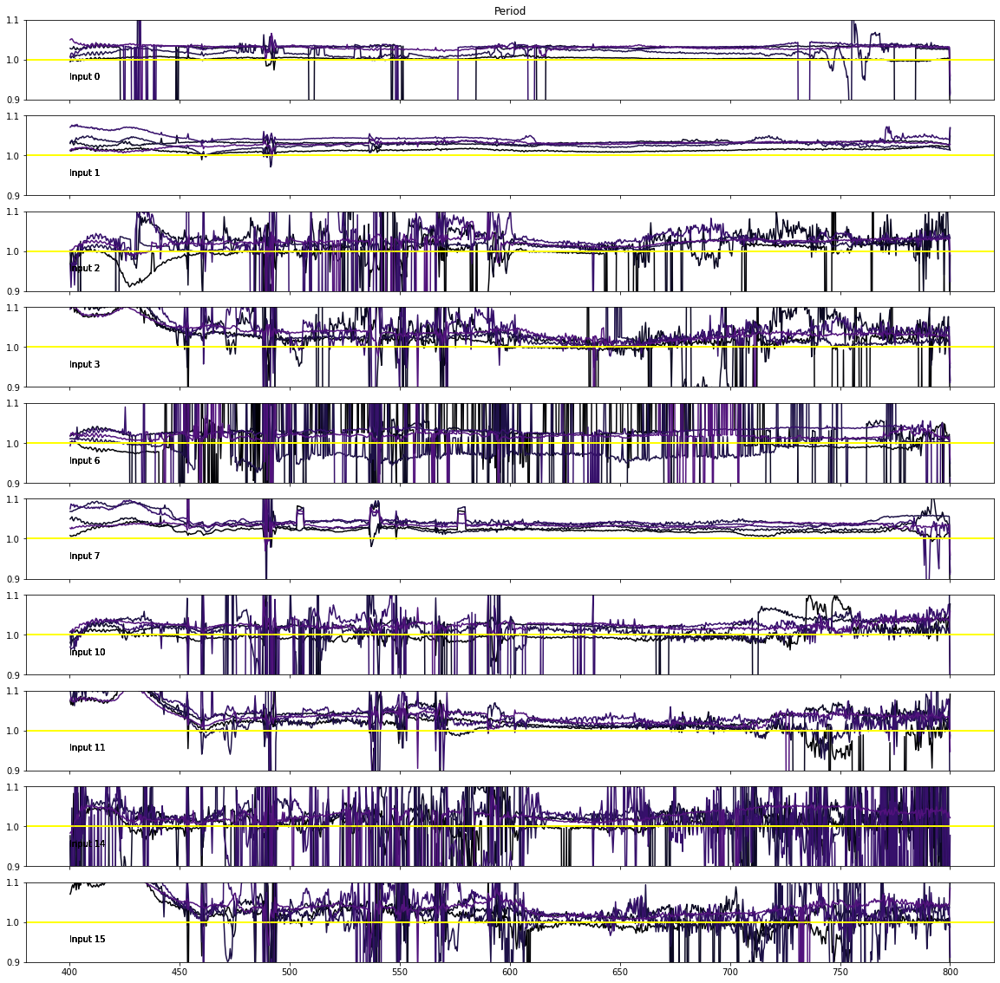

In [46]:
# Look at Period

fig,axs = plt.subplots(10, sharex=True,figsize=(20,20))
#for fi in np.arange(len(fits[:,0,0,0])): # fit param
fi = 1
for p,chind in enumerate(allgoodpols):
    for k in np.arange(lp):
        axs[p].plot(freqs,fits[fi,k,chind,:],color=colorz[k])
        axs[p].set_ylim(0.9,1.1)
        axs[p].text(400,0.95,'Input '+str(chind))
        axs[p].axhline(1.0,color='yellow')
axs[0].set_title(titles[fi])
    
fig.show()

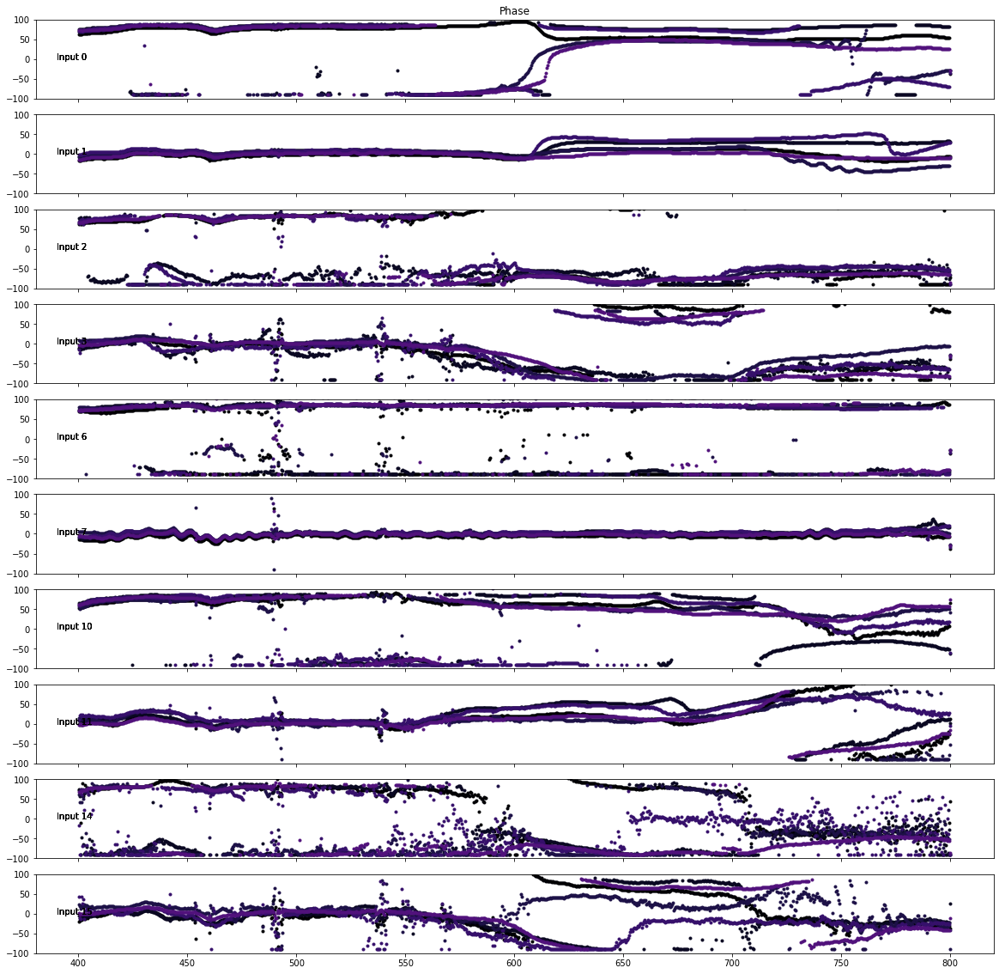

In [101]:
#for fi in np.arange(len(fits[:,0,0,0])): # fit param
# Look at Phase


fig,axs = plt.subplots(10, sharex=True,figsize=(20,20))

fi = 2
for p,chind in enumerate(allgoodpols):
    for k in np.arange(lp):
        #flips = np.where(np.degrees(fits[fi,k,chind,:])<-45)
        #copyfits[fi,k,chind,flips] = abs(fits[fi,k,chind,flips])
        axs[p].plot(freqs,np.degrees(fits[fi,k,chind,:]),color=colorz[k],linestyle='None',marker='.')
        axs[p].set_ylim(-100,100)
        axs[p].text(390,-1,'Input '+str(chind))
        #axs[p].axhline(0.0,color='yellow')
axs[0].set_title(titles[fi])
    
fig.show()

[0, 1, 2, 3, 6, 7, 10, 11, 14, 15]


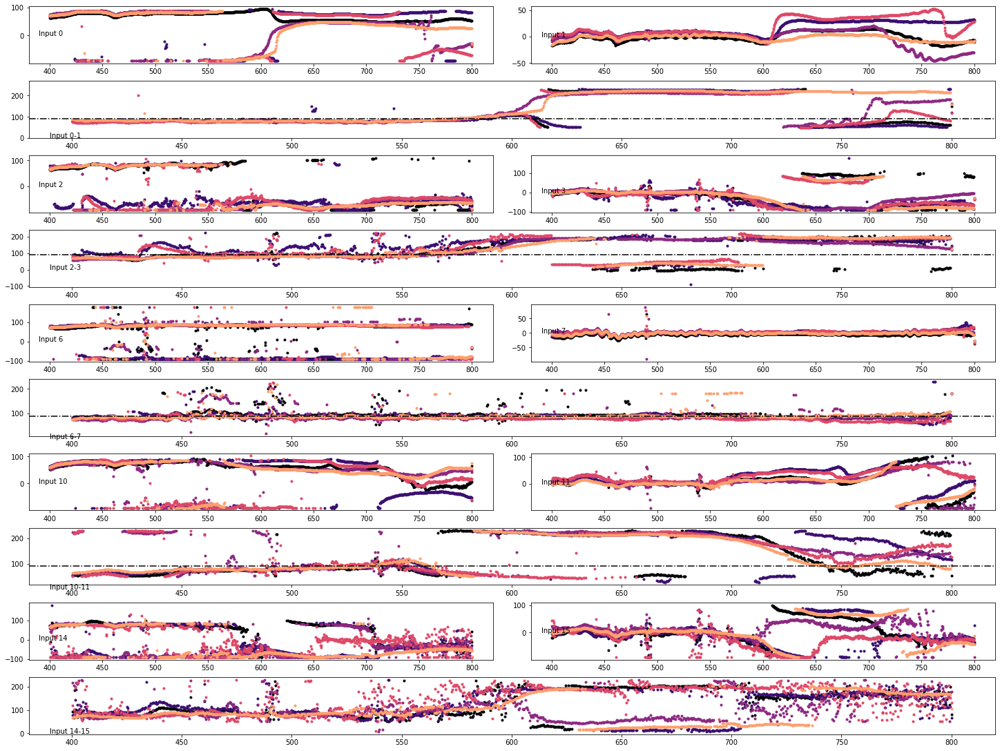

In [110]:
# Look at Phase

print(allgoodpols)

colorz=pu.cm_to_discrete(ccm,5)
fig = plt.figure(constrained_layout=True,figsize=(20,15))

gs = GridSpec(10, 2, figure=fig)
axs0 = fig.add_subplot(gs[0, 0])
axs1 = fig.add_subplot(gs[0, 1])
axs2 = fig.add_subplot(gs[1, :])
axs3 = fig.add_subplot(gs[2, 0])
axs4 = fig.add_subplot(gs[2, 1])
axs5 = fig.add_subplot(gs[3, :])
axs6 = fig.add_subplot(gs[4, 0])
axs7 = fig.add_subplot(gs[4, 1])
axs8 = fig.add_subplot(gs[5, :])
axs9 = fig.add_subplot(gs[6, 0])
axs10 = fig.add_subplot(gs[6, 1])
axs11 = fig.add_subplot(gs[7, :])
axs12 = fig.add_subplot(gs[8, 0])
axs13 = fig.add_subplot(gs[8, 1])
axs14 = fig.add_subplot(gs[9, :])

#for fi in np.arange(len(fits[:,0,0,0])): # fit param
fi = 2

# input0,1
for k in np.arange(lp):
    axs0.plot(freqs,np.degrees(fits[fi,k,allgoodpols[0],:]),color=colorz[k],linestyle='None',marker='.')
    axs1.plot(freqs,np.degrees(fits[fi,k,allgoodpols[1],:]),color=colorz[k],linestyle='None',marker='.')
    axs3.plot(freqs,np.degrees(fits[fi,k,allgoodpols[2],:]),color=colorz[k],linestyle='None',marker='.')
    axs4.plot(freqs,np.degrees(fits[fi,k,allgoodpols[3],:]),color=colorz[k],linestyle='None',marker='.')
    axs6.plot(freqs,np.degrees(fits[fi,k,allgoodpols[4],:]),color=colorz[k],linestyle='None',marker='.')
    axs7.plot(freqs,np.degrees(fits[fi,k,allgoodpols[5],:]),color=colorz[k],linestyle='None',marker='.')
    axs9.plot(freqs,np.degrees(fits[fi,k,allgoodpols[6],:]),color=colorz[k],linestyle='None',marker='.')
    axs10.plot(freqs,np.degrees(fits[fi,k,allgoodpols[7],:]),color=colorz[k],linestyle='None',marker='.')
    axs12.plot(freqs,np.degrees(fits[fi,k,allgoodpols[8],:]),color=colorz[k],linestyle='None',marker='.')
    axs13.plot(freqs,np.degrees(fits[fi,k,allgoodpols[9],:]),color=colorz[k],linestyle='None',marker='.')


    chind = allgoodpols[0]
    esig = fits[fi,k,chind,:]
    nsig = fits[fi,k,chind+1,:]
    diff = (180/np.pi)*(esig-nsig)+180

    for i in np.arange(0,1024):
        if diff[i] > 230: diff[i] = diff[i]-180
        if diff[i] > 100: badfreqs.append(i)
    axs2.plot(freqs,diff,
                 color=colorz[k],marker='.',linestyle='None',label='Input '+str(chind)+' - Input '+str(chind+1))
    
    
    chind = allgoodpols[2]
    esig = fits[fi,k,chind,:]
    nsig = fits[fi,k,chind+1,:]
    diff = (180/np.pi)*(esig-nsig)+180

    for i in np.arange(0,1024):
        if diff[i] > 230: diff[i] = diff[i]-180
        if diff[i] > 100: badfreqs.append(i)
    axs5.plot(freqs,diff,
                 color=colorz[k],marker='.',linestyle='None',label='Input '+str(chind)+' - Input '+str(chind+1))
    
    chind = allgoodpols[4]
    esig = fits[fi,k,chind,:]
    nsig = fits[fi,k,chind+1,:]
    diff = (180/np.pi)*(esig-nsig)+180

    for i in np.arange(0,1024):
        if diff[i] > 230: diff[i] = diff[i]-180
        if diff[i] > 100: badfreqs.append(i)
    axs8.plot(freqs,diff,
                 color=colorz[k],marker='.',linestyle='None',label='Input '+str(chind)+' - Input '+str(chind+1))
    
    chind = allgoodpols[6]
    esig = fits[fi,k,chind,:]
    nsig = fits[fi,k,chind+1,:]
    diff = (180/np.pi)*(esig-nsig)+180

    for i in np.arange(0,1024):
        if diff[i] > 230: diff[i] = diff[i]-180
        if diff[i] > 100: badfreqs.append(i)
    axs11.plot(freqs,diff,
                 color=colorz[k],marker='.',linestyle='None',label='Input '+str(chind)+' - Input '+str(chind+1))
    
    chind = allgoodpols[8]
    esig = fits[fi,k,chind,:]
    nsig = fits[fi,k,chind+1,:]
    diff = (180/np.pi)*(esig-nsig)+180

    for i in np.arange(0,1024):
        if diff[i] > 230: diff[i] = diff[i]-180
        if diff[i] > 100: badfreqs.append(i)
    axs14.plot(freqs,diff,
                 color=colorz[k],marker='.',linestyle='None',label='Input '+str(chind)+' - Input '+str(chind+1))
    
axs2.axhline(90,color='black',ls='-.')
axs5.axhline(90,color='black',ls='-.')
axs8.axhline(90,color='black',ls='-.')
axs11.axhline(90,color='black',ls='-.')

axs0.text(390,-1,'Input 0')
axs1.text(390,-1,'Input 1')
axs2.text(390,-1,'Input 0-1')
axs3.text(390,-1,'Input 2')
axs4.text(390,-1,'Input 3')
axs5.text(390,-1,'Input 2-3')
axs6.text(390,-1,'Input 6')
axs7.text(390,-1,'Input 7')
axs8.text(390,-1,'Input 6-7')
axs9.text(390,-1,'Input 10')
axs10.text(390,-1,'Input 11')
axs11.text(390,-1,'Input 10-11')
axs12.text(390,-1,'Input 14')
axs13.text(390,-1,'Input 15')
axs14.text(390,-1,'Input 14-15')

axs2.set_ylim(0,270)
    
fig.show()

In [ ]:
colorz=pu.cm_to_discrete(ccm,16)
fi = 2
k = 0#4
lp = 1


fig = plt.figure(constrained_layout=True,figsize=(20,15))

gs = GridSpec(5, 2, figure=fig)
axs0 = fig.add_subplot(gs[0, 0])
axs1 = fig.add_subplot(gs[1, 0])
axs2 = fig.add_subplot(gs[0, 1])
axs3 = fig.add_subplot(gs[1, 1])
axs4 = fig.add_subplot(gs[2, :])
axs5 = fig.add_subplot(gs[3, :])
axs6 = fig.add_subplot(gs[4, :])



find = 900
chind1 = 0
chind2 = 1
axs0.plot(shiftedyaw[poss[k]], 
            1e7*(concattest.V[poss[k],find,chind1]), '.', 
                    markersize = 3,color=colorz[4],label='input '+str(chind1))
axs0.plot(shiftedyaw[poss[k]], 
                1e7*(concattest.V[poss[k],find,chind2]), '.', 
                      markersize = 3,color=colorz[8],label='input '+str(chind2))
popt1 = fits[:,k,chind1,find]
axs0.plot(np.linspace(0,270,270), cos2_fun(np.linspace(0,270,270), *popt1), color='black',linestyle='-.')
popt1 = fits[:,k,chind2,find]
axs0.plot(np.linspace(0,270,270), cos2_fun(np.linspace(0,270,270), *popt1), color='black',linestyle='-.')

find = 200
axs1.plot(shiftedyaw[poss[k]], 
            1e7*(concattest.V[poss[k],find,chind1]), '.', 
                    markersize = 3,color=colorz[4],label='input '+str(chind1))
axs1.plot(shiftedyaw[poss[k]], 
                1e7*(concattest.V[poss[k],find,chind2]), '.', 
                      markersize = 3,color=colorz[8],label='input '+str(chind2))
popt1 = fits[:,k,chind1,find]
axs1.plot(np.linspace(0,270,270), cos2_fun(np.linspace(0,270,270), *popt1), color='black',linestyle='-.')
popt1 = fits[:,k,chind2,find]
axs1.plot(np.linspace(0,270,270), cos2_fun(np.linspace(0,270,270), *popt1), color='black',linestyle='-.')

find = 900
chind1 = 6
chind2 = 7
axs2.plot(shiftedyaw[poss[k]], 
            1e7*(concattest.V[poss[k],find,chind1]), '.', 
                    markersize = 3,color=colorz[10],label='input '+str(chind1))
axs2.plot(shiftedyaw[poss[k]], 
                1e7*(concattest.V[poss[k],find,chind2]), '.', 
                      markersize = 3,color=colorz[14],label='input '+str(chind2))
popt1 = fits[:,k,chind1,find]
axs2.plot(np.linspace(0,270,270), cos2_fun(np.linspace(0,270,270), *popt1), color='black',linestyle='-.')
popt1 = fits[:,k,chind2,find]
axs2.plot(np.linspace(0,270,270), cos2_fun(np.linspace(0,270,270), *popt1), color='black',linestyle='-.')

find = 200
axs3.plot(shiftedyaw[poss[k]], 
            1e7*(concattest.V[poss[k],find,chind1]), '.', 
                    markersize = 3,color=colorz[10],label='input '+str(chind1))
axs3.plot(shiftedyaw[poss[k]], 
                1e7*(concattest.V[poss[k],find,chind2]), '.', 
                      markersize = 3,color=colorz[14],label='input '+str(chind2))
popt1 = fits[:,k,chind1,find]
axs3.plot(np.linspace(0,270,270), cos2_fun(np.linspace(0,270,270), *popt1), color='black',linestyle='-.')
popt1 = fits[:,k,chind2,find]
axs3.plot(np.linspace(0,270,270), cos2_fun(np.linspace(0,270,270), *popt1), color='black',linestyle='-.')


for p,chind in enumerate(allgoodpols):
    axs4.plot(freqs,180*fits[1,0,chind,:],color=colorz[chind],marker='.',
                markersize=3,linestyle='None')
    axs4.set_ylim(0.9*180,1.1*180)
    axs4.axhline(1.0*180,color='black',linestyle='-.')


for p,chind in enumerate([0,2,10,14]):
    esig = fits[fi,k,chind,:]
    nsig = fits[fi,k,chind+1,:]
    diff = (180/np.pi)*(esig-nsig)+180

    for i in np.arange(0,1024):
        if diff[i] > 230: diff[i] = diff[i]-180
        if diff[i] > 100: badfreqs.append(i)
    axs5.plot(freqs,diff,
                 color=colorz[chind],marker='.',
                markersize=4,linestyle='None',label='Input '+str(chind)+' - Input '+str(chind+1))
    axs5.axhline(90,color='black',ls='-.')
chind = 6
esig = fits[fi,k,chind,:]
nsig = fits[fi,k,chind+1,:]
diff = (180/np.pi)*(esig-nsig)+180

for i in np.arange(0,1024):
    if diff[i] > 230: diff[i] = diff[i]-180
    if diff[i] > 100: badfreqs.append(i)
axs6.plot(freqs,diff,
                 color=colorz[p],marker='.',linestyle='None',label='Input '+str(chind)+' - Input '+str(chind+1))
axs6.axhline(90,color='black',ls='-.')
    
axs0.text(240,1.05,'Frequency: 448 MHz',fontsize=16)
axs0.text(240,0.85,'Input 0',color=colorz[4],fontsize=16)
axs0.text(240,0.7,'Input 1',color=colorz[8],fontsize=16)
axs0.set_xlabel('Yaw angle [degrees from North]',fontsize=16)
axs0.set_ylabel('Amplitude [arb]',fontsize=16)
axs0.set_ylim(0,1.3)

axs1.text(240,1.05,'Frequency: 722 MHz',fontsize=16)
axs1.text(240,0.85,'Input 0',color=colorz[4],fontsize=16)
axs1.text(240,0.7,'Input 1',color=colorz[8],fontsize=16)
axs1.set_xlabel('Yaw angle [degrees from North]',fontsize=16)
axs1.set_ylabel('Amplitude [arb]',fontsize=16)
axs1.set_ylim(0,1.3)

axs2.text(240,1.05,'Frequency: 448 MHz',fontsize=16)
axs2.text(240,0.85,'Input 6 (CHIME)',color=colorz[10],fontsize=16)
axs2.text(240,0.7,'Input 7 (CHIME)',color=colorz[14],fontsize=16)
axs2.set_xlabel('Yaw angle [degrees from North]',fontsize=16)
axs2.set_ylim(0,1.3)

axs3.text(240,1.05,'Frequency: 722 MHz',fontsize=16)
axs3.text(240,0.85,'Input 6 (CHIME)',color=colorz[10],fontsize=16)
axs3.text(240,0.7,'Input 7 (CHIME)',color=colorz[14],fontsize=16)
axs3.set_xlabel('Yaw angle [degrees from North]',fontsize=16)
axs3.set_ylim(0,1.3)

#axs4.set_xlabel('Frequency [MHz]',fontsize=16)
axs4.set_ylabel('Period [degrees]',fontsize=16)

#axs5.set_xlabel('Frequency [MHz]',fontsize=16)
axs5.text(390,140,'Phase angle difference [degrees] : HIRAX inputs',fontsize=16)
axs5.legend(ncol=2,fontsize=12)

axs6.set_xlabel('Frequency [MHz]',fontsize=16)
axs6.text(390,100,'Phase angle difference [degrees] : CHIME inputs',fontsize=16)
axs6.set_ylim(70,110)

plt.show()
fig.clf()

In [ ]:
fig,axs = plt.subplots(10, sharex=True,figsize=(20,20))
#for fi in np.arange(len(fits[:,0,0,0])): # fit param
fi = 2
for p,chind in enumerate(allgoodpols):
    for k in np.arange(lp):
        #flips = np.where(np.degrees(fits[fi,k,chind,:])<-45)
        #copyfits[fi,k,chind,flips] = abs(fits[fi,k,chind,flips])
        axs[p].plot(freqs,np.degrees(fits[fi,k,chind,:]),color=colorz[k],linestyle='None',marker='.')
        axs[p].set_ylim(-90,90)
        axs[p].text(390,-1,'Input '+str(chind))
        #axs[p].axhline(0.0,color='yellow')
axs[0].set_title(titles[fi])
    
fig.show()

In [ ]:
# Look at offset

fig,axs = plt.subplots(10, sharex=True,figsize=(20,20))
#for fi in np.arange(len(fits[:,0,0,0])): # fit param
fi = 3
for p,chind in enumerate(allgoodpols):
    for k in np.arange(lp):
        axs[p].plot(freqs,fits[fi,k,chind,:],color=colorz[k])
        axs[p].set_ylim(0,0.9)
        #axs[p].text(400,0.5,'Input '+str(chind))
axs[0].set_title(titles[fi])
    
fig.show()

In [ ]:
# Look at the CHIME feeds specifically first

# Lets try fitting a sine to the CHIME inputs, we'll start with position 4

poss = [pos4]
find = 200
chind1 = 6
chind2 = 7
fi = 2

 
plt.plot(freqs,(180/np.pi)*np.abs((fits[fi,k,chind1,:] - fits[fi,k,chind2,:])),marker='.',linestyle='None',color='red')
plt.show()



In [ ]:
# Look at Phase

fig,axs = plt.subplots(5, sharex=True,figsize=(20,20))
#for fi in np.arange(len(fits[:,0,0,0])): # fit param
fi = 2
k = 1#4
poss = [pos0,pos1,pos2,pos3,pos4]
pl = ['0','1','2','3','4']
lp = 5

for p,chind in enumerate(E_pols):
    for k in [4]:#[1,2,4]:
        axs[p].plot(freqs,(180/np.pi)*np.abs((fits[fi,k,chind,:]-fits[fi,k,chind+1,:])),
                    color=colorz[k],label='Pos '+pl[k])
        #axs[p].set_ylim(0,4.5)
        axs[p].text(400,150,'Input '+str(chind)+'- Input '+str(chind+1))
        axs[p].legend()
        axs[p].axhline(90,color='black',ls='-.')
        #axs[p].axhline(0.0,color='yellow')
axs[0].set_title('Phase Difference between E pol and N pol')
axs[2].text(400,25,'CHIME FEED',fontsize=22)
    
fig.show()

In [ ]:
# From the above:


# Suggest we first restrict ourselves to the best SNR location, loc 4

poss = [pos4]
lp = 1

for i, find in enumerate(np.arange(1000,0,-128)): 
    fig,axs = plt.subplots(2,5, sharex=True,figsize=(10,8))
    for p,chind in enumerate(N_pols):
        for k in np.arange(lp):
            
            #try:
                gi = np.where(1e7*(concattest.V[poss[k],find,chind]) < 1.191)[0]
                popt, pcov = opt.curve_fit(cos2_fun, shiftedyaw[poss[k][gi]], \
                        1e7*(concattest.V[poss[k][gi],find,chind]), p0=[0.1,1.0,0,0.5])
                #print('newfit ',find,chind,k,popt)
                #print('old fit was ',fits[:,k,chind,find])
                axs[0,p].plot(np.linspace(0,360,360), cos2_fun(np.linspace(0,360,360), *popt), 'r')
                axs[0,p].plot(shiftedyaw[poss[k][gi]], 
                1e7*(concattest.V[poss[k][gi],find,chind]), '.', 
                      markersize = 2,color=colorz[k],label='loc'+str(k))
            #except:''
            #axs[0,p].set_title('Input '+str(chind))
    for p,chind in enumerate(E_pols):
        for k in np.arange(lp):
            
            try:
                gi = np.where(1e7*(concattest.V[poss[k],find,chind]) < 1.191)[0]
                popt, pcov = opt.curve_fit(cos2_fun, shiftedyaw[poss[k][gi]], \
                        1e7*(concattest.V[poss[k][gi],find,chind]), p0=[0.1,1,0,0.5])
                #print('new fit ',find,chind,k,popt)
                #print('old fit was ',fits[:,k,chind,find])
                axs[1,p].plot(np.linspace(0,360,360), cos2_fun(np.linspace(0,360,360), *popt), 'r')
                axs[1,p].plot(shiftedyaw[poss[k][gi]], 
                1e7*(concattest.V[poss[k][gi],find,chind]), '.', 
                      markersize = 2,color=colorz[k],label='loc'+str(k))
            except:''
            axs[1,p].set_title('Input '+str(chind))
    fig.suptitle('FREQUENCY '+str(freqs[find]))

    fig.show()

In [ ]:

poss = [pos4]
lp = 1
k=0
find = 900
chind1 = 6
chind2 = 7



plt.plot(shiftedyaw[poss[k]], 
                1e7*(concattest.V[poss[k],find,chind1]), '.', 
                      markersize = 2,color=colorz[k])
A = fits[0,4,chind1,find]
B = fits[1,4,chind1,find]
C = fits[2,4,chind1,find]
D = fits[3,4,chind1,find]
print(fits[:,4,chind1,find])

xes = np.arange(0,2*np.pi,0.01)
ff = np.abs(A*np.cos(B*(xes - C)) + D)
plt.plot(np.degrees(xes),ff)

# Play around here

a = A+D
b = B/2
c = C
d = 0.1*A
fff = a*(np.cos(b*(xes - c)))**2 + d

plt.plot(np.degrees(xes),fff,color='red')
plt.show()

In [ ]:
## Let's plot the phase and period for two CHIME feeds:

fig,axs = plt.subplots(3,2,figsize=(20,20))
poss = [pos4]
lp = 1
k=0
find = 900
chind1 = 6
chind2 = 7



axs[0,0].plot(shiftedyaw[poss[k]], 
                1e7*(concattest.V[poss[k],find,chind1]), '.', 
                      markersize = 2,color=colorz[k])
A = fits[0,4,chind1,find]
B = fits[1,4,chind1,find]
C = fits[2,4,chind1,find]
D = fits[3,4,chind1,find]
print(fits[:,4,chind1,find])

xes = np.arange(0,2*np.pi,0.01)
ff = np.abs(A*np.cos(B*(xes - C)) + D)
axs[0,0].plot(np.degrees(xes),ff)

a = A
b = B
c = C+np.pi
d = D
fff = a*np.abs(np.cos(b*(xes - c))) + d

axs[0,0].plot(np.degrees(xes),fff,color='red')



axs[0,1].plot(shiftedyaw[poss[k]], 
                1e7*(concattest.V[poss[k],find,chind2]), '.', 
                      markersize = 2,color=colorz[k])
#A = 1.0
#B = 1.0
#C = np.pi/2
#D = 0.0
#ff = np.abs(A*np.cos(B*(xes - C)) + D)
#axs[0,1].plot(np.degrees(xes),ff)


axs[1,0].plot(freqs,fits[1,k,chind1,:],color=colorz[k])
axs[1,1].plot(freqs,fits[1,k,chind2,:],color=colorz[k])
axs[1,0].set_ylabel('Period')

axs[2,0].plot(freqs,fits[2,k,chind1,:],color=colorz[k])
axs[2,1].plot(freqs,fits[2,k,chind2,:],color=colorz[k])
axs[2,0].set_ylabel('Phase')

fig.show()

In [ ]:

A = 1.0
B = 1.0
C = np.pi/2
D = 0.0

xes = np.arange(0,2*np.pi,0.01)
ff = A*np.cos(B*(xes - C)) + D
plt.plot(np.degrees(xes),ff,color='blue')

a = A
b = 1.0
c = np.pi/2
d = D


fff = a*np.cos(b*(xes - c))**2 + d




plt.plot(np.degrees(xes),fff,color='red')

In [ ]:
# Lets try fitting a sine to the CHIME inputs, we'll start with position 4

poss = [pos0]
find = 200
chind = 6

plt.plot(shiftedyaw[poss[0]], 
        1e7*(concattest.V[poss[0],find,chind]),marker='.',linestyle='None')

gi = np.where(1e7*(concattest.V[poss[0],find,chind]) < 1.191)[0]
plt.plot(shiftedyaw[poss[0][gi]], 
        1e7*(concattest.V[poss[0][gi],find,chind]),marker='.',linestyle='None')
popt, pcov = opt.curve_fit(cos2_fun, shiftedyaw[poss[0][gi]], \
                               1e7*(concattest.V[poss[0][gi],find,chind]), p0=[0.1,1.0,0,0.1])
print('chind1 ',popt)
plot(np.linspace(0,360,360), cos2_fun(np.linspace(0,360,360), *popt), 'k')


xes = np.arange(0,2*np.pi,0.01)

a = 1.0
b = 1.0
c = 0.0
d = 1.1

fff = a*np.cos(b*(xes - c))**2 + d
plot(np.degrees(xes),fff, 'r')

plt.show()

print('cos sq ', popt)


poss = [pos0]
find = 200
chind = 7

plt.plot(shiftedyaw[poss[0]], 
        1e7*(concattest.V[poss[0],find,chind]),marker='.',linestyle='None')

print(max(1e7*(concattest.V[poss[0],find,chind])))

# For this channel, the max seems to be 1.191

gi = np.where(1e7*(concattest.V[poss[0],find,chind]) < 1.191)[0]

plt.plot(shiftedyaw[poss[0][gi]], 
        1e7*(concattest.V[poss[0][gi],find,chind]),marker='.',linestyle='None')


popt, pcov = opt.curve_fit(cos2_fun, shiftedyaw[poss[0][gi]], \
                               1e7*(concattest.V[poss[0][gi],find,chind]), p0=[0.1,1.0,0,0.1])
plot(np.linspace(0,360,360), cos2_fun(np.linspace(0,360,360), *popt), 'k')
plot(np.linspace(0,360,360), cos2_fun(np.linspace(0,360,360), [1.0,1.0,0.0,0.2]), 'r')

plt.show()

print('cos 2 ',popt)